## Problem Statement

For this particular assignment, the data of different types of wine sales in the 20th century is to be analysed. Both of these data are from the same company but of different wines. As an analyst in the ABC Estate Wines, you are tasked to analyse and forecast Wine Sales in the 20th century.

### General Comments to Appproach Taken

I have generally tried to answer all the sections in the paper and have added certain parts. There are extra packages needed to fun the code which form part of my usual workflow and I will list them here as I may not be able to send an environment file. 
I will add the extra packages commented out in a code block to make the process simpler if you have to re-run to check anything. 
Because I use the tree explorer in Visual Studio I have sections and subsection in my markdowns and have tried to keep it as consistent as possible

List of extra packages and use:

1. dataprep - for automatic EDA, timesaver to give overall picture of code
2. altair - this creates beautiful facet  plots that I generally prefer to use in code


Also please note I had to use cg optimisation for the SARIMA because I had an optimisation error with my LF-BFG method on my computer and my environment. I tried restarting but none of the models would converge.

### Installing extra packages

In [1]:
#!pip install dataprep
#!pip install altair

## Importing necessary libraries

In [2]:
from statsmodels.tsa.arima.model import ARIMA as ar
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import LinearRegression
import statsmodels as st
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from statsmodels.tsa.arima.model import ARIMA
import itertools
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


import numpy as np
import pandas as pd
from sklearn import metrics
import matplotlib.pyplot as plt
#import plotly.offline as py

%matplotlib inline
import seaborn as sns
from pylab import rcParams


from sklearn.model_selection import ParameterGrid

In [3]:
#setting the warnings off
import warnings 
warnings.filterwarnings('ignore')

##always set the seedf for reproducibility of you machine learning working worjflow, I might not need it now but will use it 
RANDOM_SEED = np.random.seed(0)

## Loading the dataset

In [4]:
import os 


###set file name to the current working directory where the full code notebook is so we can open the file 
file_name = f"""{os.getcwd()}/Sparkling.csv"""

In [5]:
#####set the sparkling_df as and set the parse_dates to true 
df_final = pd.read_csv(file_name,parse_dates=True)

## Data Overview

In [6]:
#show the top values in the dataset to get a sense of the data and what it looks like 
df_final.head(5)

,YearMonth,Sparkling
0,1980-01,1686
1,1980-02,1591
2,1980-03,2304
3,1980-04,1712
4,1980-05,1471


In [7]:
#show the shape of the dataset
df_final.shape

(187, 2)

In [8]:
#a print out of the shape of the dataset
print(f"""Your data has {df_final.shape[0]} rows and {df_final.shape[1]}  columns.""")

Your data has 187 rows and 2  columns.


In [9]:
#information on the dataset 
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   YearMonth  187 non-null    object
 1   Sparkling  187 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 3.0+ KB


In [10]:
#description of the dataset statistics
df_final.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Sparkling,187.0,2402.417112,1295.11154,1070.0,1605.0,1874.0,2549.0,7242.0


### Pre-processing Our data

We add a date index and do cursory checks to make sure we are running our EDA on data that makes sense and does not have:

1. Missing values 
2. Repeated values in the date column 

If any of these cases are found we can treat them by interpolating for missing values and averaging if there are multiple values for the same month as the description of the data and exploration of data.head shows data at a month;y frequncy

##### Checking for Missing values

In [11]:
#function that prints out whether there are missing values in the data or not 
if (df_final.isnull().sum())[0] > 0 :
  
    print(f"""There are {(df_final.isnull().sum())[0]} missing values and you have to interpolate""")
else:
    print("There are no mising values in the dataset")

There are no mising values in the dataset


##### Checking for duplicates

In [12]:
"""
We write code to identify duplicates in the  column with the Dates, i.e. we wxpect only one record for each Year-Month value and 
if there is more than one repeated value we get the average for that month

"""

duplicates = df_final[df_final["YearMonth"].duplicated()]

if not duplicates.empty:
    print("There are some repeated values for some months in the column date column, need to create average:")
    print(duplicates)
else:
    print("No duplicates found in the date column no need to average")


No duplicates found in the date column no need to average


In [13]:
##creating the datetime column that is the index for the data and the start is the first date which is 1980-01-01, we set monthly frequency to the data
date_time = pd.date_range(start = '1980-01-01', periods = len(df_final) , freq = 'M')
date_time


DatetimeIndex(['1980-01-31', '1980-02-29', '1980-03-31', '1980-04-30',
               '1980-05-31', '1980-06-30', '1980-07-31', '1980-08-31',
               '1980-09-30', '1980-10-31',
               ...
               '1994-10-31', '1994-11-30', '1994-12-31', '1995-01-31',
               '1995-02-28', '1995-03-31', '1995-04-30', '1995-05-31',
               '1995-06-30', '1995-07-31'],
              dtype='datetime64[ns]', length=187, freq='M')

In [14]:
df_final

,YearMonth,Sparkling
0,1980-01,1686
1,1980-02,1591
2,1980-03,2304
3,1980-04,1712
4,1980-05,1471
...,...,...
182,1995-03,1897
183,1995-04,1862
184,1995-05,1670
185,1995-06,1688


In [15]:
#we set the date time and set the index to this column so we can set the datetime, we also drop the date_time column as it is not necessary
df_final['date_time'] = date_time
df_final.set_index(keys='date_time',inplace=True)
##removing the column YearMonth from the table
df_final.drop(['YearMonth'],axis=1,inplace=True)
df_final.head(3)

,Sparkling
date_time,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304


## Exploratory Data Analysis (EDA)


For the EDA I will use an automatic package to get an iverall view and then use drill downs for the the general set. My process is to look at the size of the data fist but since the data only has 187 columns I can use the package to get high level insights on the data

### Statistical Analysis

In [16]:
#this describes the statistical properties of the data 
df_final.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Sparkling,187.0,2402.417112,1295.11154,1070.0,1605.0,1874.0,2549.0,7242.0


### Automated EDA 
The purpose of the EDA is to gain high level insights into the data and determine if the data can be used to answer the questions I have been provided with. Given that the task of the project is to gain insights on the historical sales and make accurate forecasts for future wine sales the focus of the EDA will be to do the following:


1. Gain an understanding of the data structure for the sparkling sales as in the distribution 
2. Gain an understanding of the historical patterns of the sales data. i.e :
        - Analysing how sales perform each year
        - Analysing how sales perform each month for all the years 
        - The seasonal pattern of sales if any and its behavior (i.e is it additive or multiplicative in nature as well as how many seasons there are per year)
        - The general trend of sales for the period provided if any is present

These insights will provide a high level understanding of the data and the direction of the analysis as well as any potential data and feature engineering techniques that need to be applied in order to run the predictions. 

In [17]:
#install the dataprep package or module 
#!pip install dataprep

  0%|          | 0/280 [00:00<?, ?it/s]

DataPrep Report
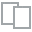
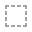
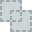
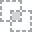
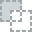
...
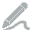
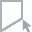
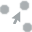
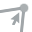
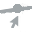

In [18]:
from dataprep.eda import create_report

#we use the data prep create report function to create an initial EDA report on our data to give us an overall idea of what is going on 

create_report(df_final.reset_index())

According to the EDA:

1. there are no misisng values and 
2. the sparkling wine values are skewed and we 
3. The year 1995 only goes up to the month of July


We will now visualise some properties of the data and sparkling series in terms of distribution of the time series 

### How do our sales look over time?

It might be helpful to plot a timeseries of our data to get a sense of the distribution of the data across time and to get a visual sense of the performance

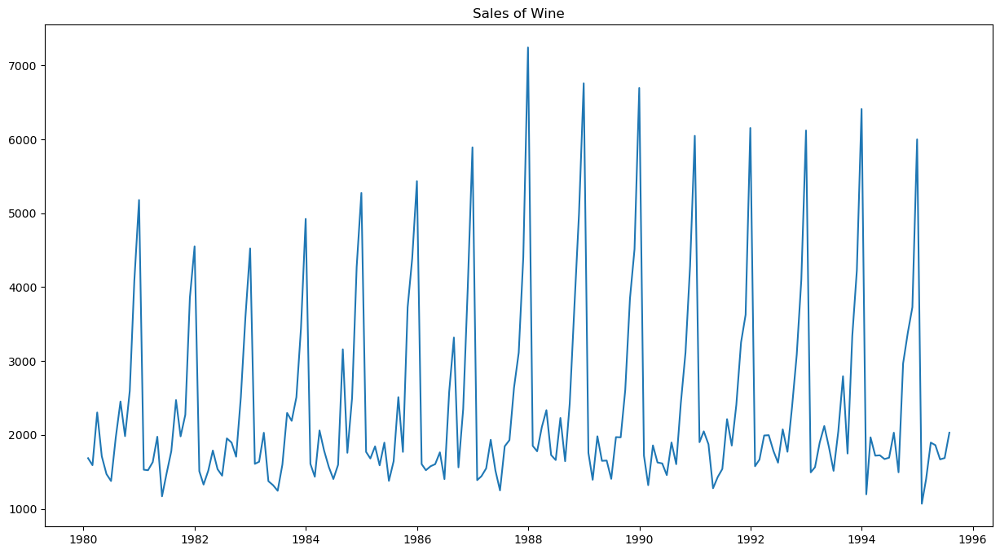

In [19]:
##we visualise the time series and show the sales over time 
rcParams['figure.figsize'] = 15,8
plt.plot(df_final);
plt.title("Sales of Wine")
plt.grid(False)

There looks to be clear seasonality in the data with a yearly pattern we will now further analyse the yearly trend

#### Yearly Trend

This gives us an understanding of the sales over the years so we can get a feel of the overall sales each year and how we are trending and performing.
Since we do not have a full year for 1995, we do not include it in our Yearly EDA analysis

In [20]:
#add the year and month columns into the table

df_final["Year"] = df_final.index.year
df_final["month"] = df_final.index.month
df_final["Quarter"] = df_final.index.quarter

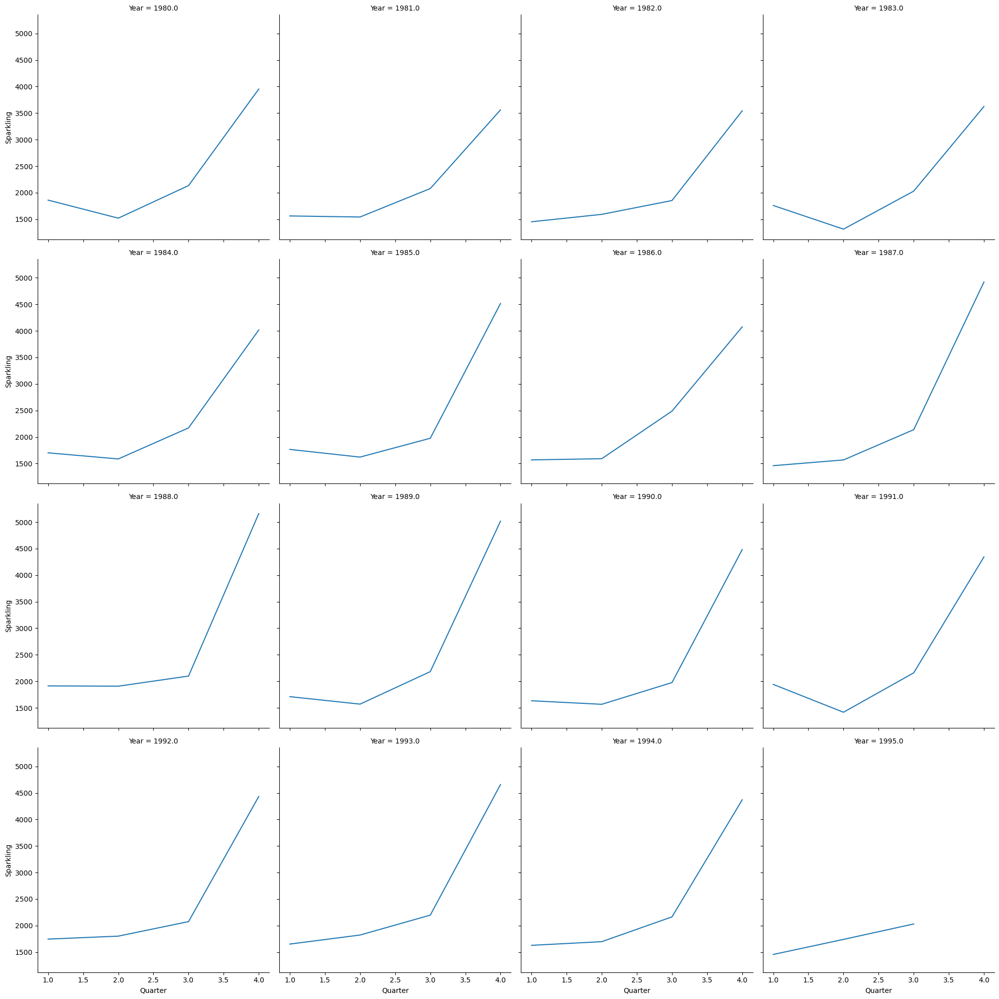

In [21]:
sns.relplot(
    data = df_final.resample('Q').mean().reset_index(),
    x = "Quarter",
    y = "Sparkling",
    col= "Year",
    col_wrap = 4,
    kind = "line"
)

In [22]:
#check that the filter excludes any data in 1995 as this is incomplete and cannot be used for a yearly analysis 
df_final[:'1994'].tail(5)

,Sparkling,Year,month,Quarter
date_time,,,,
1994-08-31,1495,1994,8,3
1994-09-30,2968,1994,9,3
1994-10-31,3385,1994,10,4
1994-11-30,3729,1994,11,4
1994-12-31,5999,1994,12,4


In [23]:
#show the performance across the years for the sparklingwine sales
# for the yearly trend we
import altair as alt

alt.Chart(df_final[:'1994'].resample('Q').mean().reset_index()).mark_line(point=True).encode(
    x='quarter(date_time)', 
    y='Sparkling',
    column='year(date_time)',
    tooltip=['date_time', 'Sparkling']).properties(
    title="Sales: Yearly Subseries plot",
    width=100).configure_header(
    titleColor='black',
    titleFontSize=14,
    labelColor='blue',
    labelFontSize=14
)

alt.Chart(...)

- We can identify a clear seasonal pattern each year so we expect our data to have a seasonal pattern that repeats each year

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


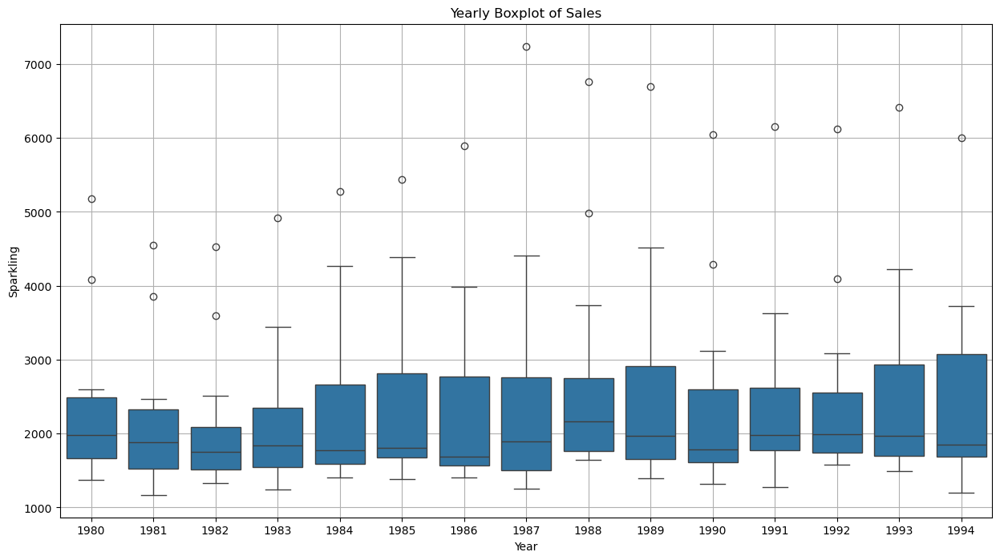

In [24]:
#boxplot to see the distribution of sales in each year 
rcParams['figure.figsize'] = 15,8
sns.boxplot(x = df_final[:'1994']["Year"],y = df_final[:'1994']['Sparkling'])
plt.title("Yearly Boxplot of Sales")
plt.grid();

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Text(0, 0.5, 'Sparkling')

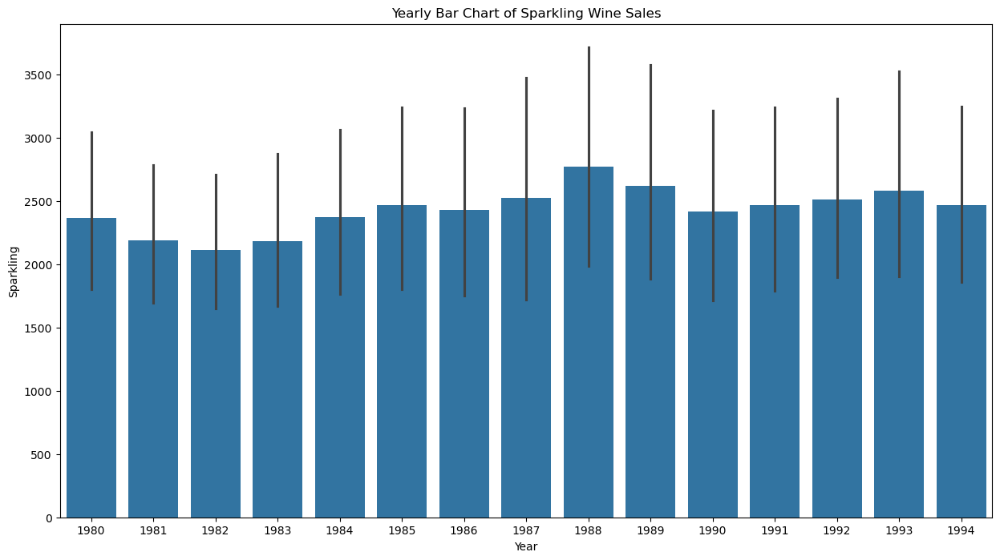

In [25]:
#showing the yearly sales
sns.barplot(x='Year', y='Sparkling', data=df_final[:'1994'])
plt.title("Yearly Bar Chart of Sparkling Wine Sales")
plt.xlabel("Year")
plt.ylabel("Sparkling")


Text(0, 0.5, 'Sparkling')

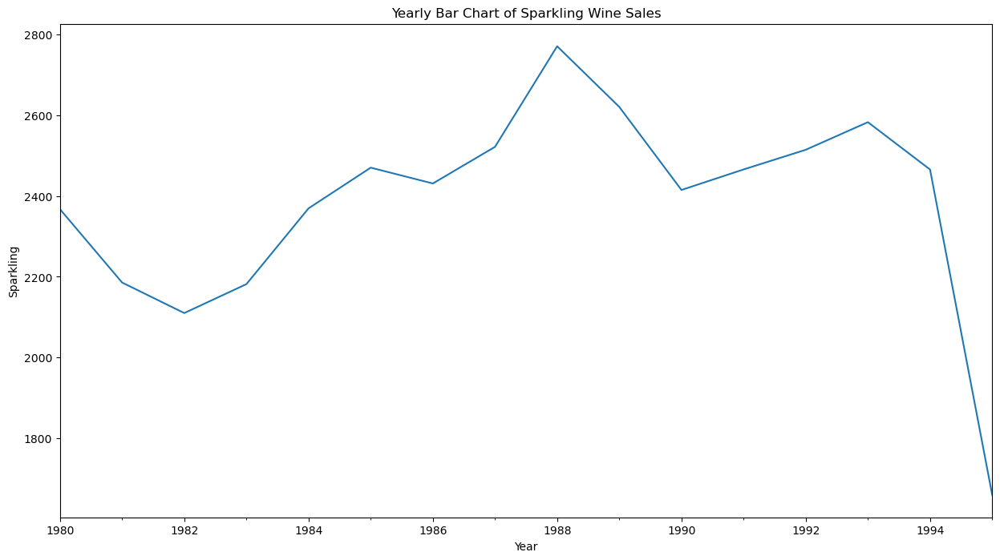

In [26]:
##showing the yearly trend, we remove 1994 as we do not have all four quarters in the data
df_final[:'1995']['Sparkling'].resample('Y').mean().plot()
plt.title("Yearly Bar Chart of Sparkling Wine Sales")
plt.xlabel("Year")
plt.ylabel("Sparkling")

In [27]:
#looking at the yoy growth to identify any patterns in the values and only consider the data up to 1994
yearly_growth = df_final[:'1994'].groupby(df_final[:'1994'].Year)["Sparkling"].sum().pct_change()*100


In [28]:
yearly_growth

Year
1980         NaN
1981   -7.670915
1982   -3.454455
1983    3.392441
1984    8.598167
1985    4.252401
1986   -1.585695
1987    3.729859
1988    9.875074
1989   -5.423209
1990   -7.842763
1991    2.105118
1992    1.973840
1993    2.717842
1994   -4.540028
Name: Sparkling, dtype: float64

Text(0, 0.5, 'Sparkling')

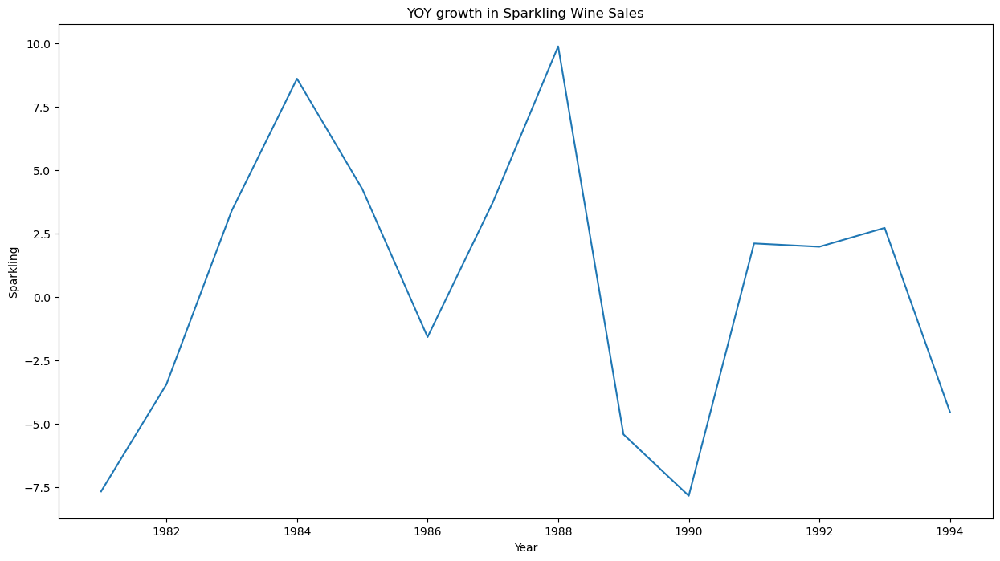

In [29]:
#plot the YOY growth or change in sales to show the performance 
yearly_growth.plot(kind='line')
plt.title("YOY growth in Sparkling Wine Sales")
plt.xlabel("Year")
plt.ylabel("Sparkling")

### Observartions


1. Sales has a general uptrend and there seems to be some cyclical nature across years in terms of sales perfromance
2. Typically sales go up from Q2 to Q4 and generally decrease from Q1 to Q2 and there is definitely a seasonal pattern in the data
3. Overall the data has outliers in each year which could correspond to sales during a specific season, special promotion or an event, these have more likely occured in Quarter 4 
4. The business has not been able to sustain a positive year on year growth for more than one year in the duration 
5. The length of the boxplots increases from 1980 - 1994 whcih means that the mean and variance are increasing and we may need to stabilize the variance by taking a log or using a Box Cox Transformation
6. We can see clear yearly seasonality in the sales each year


### Quarterly Trends and Distribution

We take a look at the performance across the different quarters to understand the performance of the business within each quarter

In [30]:
#cplot the facet plot of each quarter 
alt.Chart(df_final.resample('Q').mean().reset_index()).mark_line(point=True).encode(
    x='year(date_time)' , 
    y='Sparkling',
    column='quarter(date_time)',
    tooltip=['date_time', 'Sparkling']).properties(
    title="Sales: Quarterly Subseries plot").configure_header(
    titleColor='black',
    titleFontSize=14,
    labelColor='blue',
    labelFontSize=14
)
#.properties(
#    width = 'container'
#)

alt.Chart(...)

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


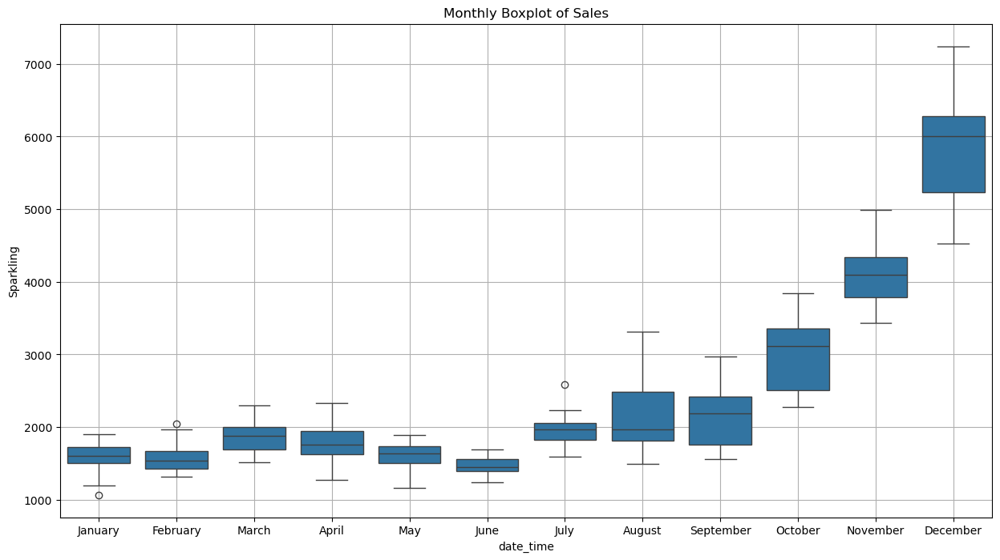

In [31]:
#boxplot of the monthly sales
sns.boxplot(x = df_final.index.month_name(),y = df_final['Sparkling'])
plt.title("Monthly Boxplot of Sales")
plt.grid();

Text(158.22222222222223, 0.5, 'Year')

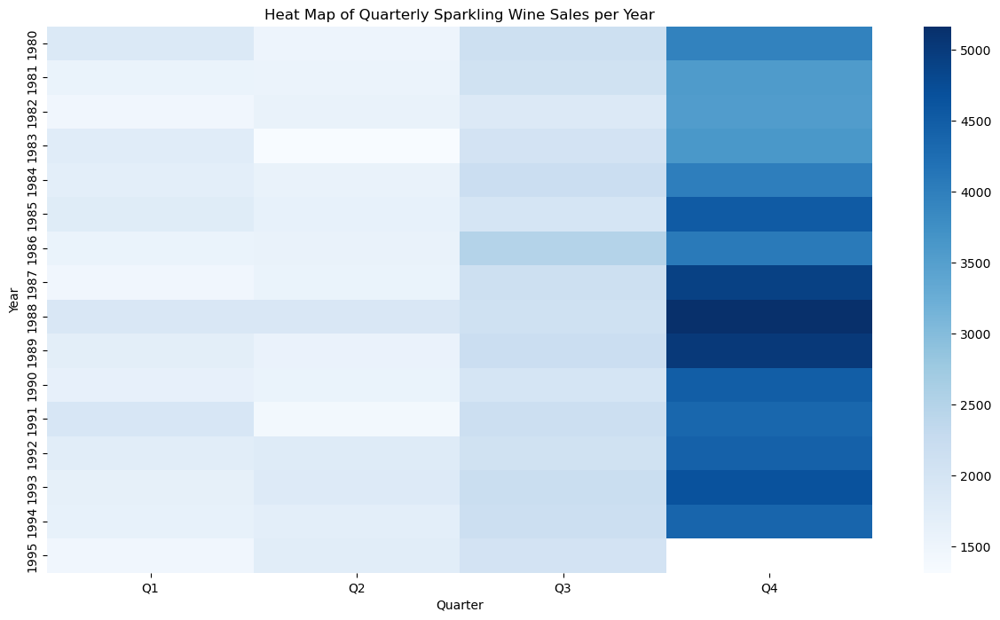

In [32]:
#heatmap showing the distribution of the sales across quarters

sns.heatmap(pd.pivot_table(data=df_final[["Sparkling"]], index=df_final.index.year, columns=df_final.index.quarter),
           square=False,
           cmap='Blues',
           xticklabels=["Q1", "Q2", "Q3", "Q4"]);

plt.title("Heat Map of Quarterly Sparkling Wine Sales per Year")
plt.xlabel("Quarter")
plt.ylabel("Year")

- We can see from the heatmap that the quarter four performance has generally been doing better from 1980 although we could tell that from the plot before
- Our best years were from 1987 to 1989

### Assessing the seasonality

Here we try to ascertain the additive and multiplicative effect in each quarter and the impact each quarter has on the average sales

In [33]:
###get the average of the sales until the year 1994 (the one we have a full year)
avg_till_1994 =  int(df_final[:'1994'].mean()[0])

##Avg sales per quarter
qrt_avg= df_final[:'1994'].groupby(df_final[:'1994'].index.quarter)["Sparkling"].mean()

##groupby quarter
qrt_table = pd.pivot_table(df_final[:'1994'][["Sparkling"]], index=df_final[:'1994'].index.quarter, columns = df_final[:'1994'].index.year)


#add qrt_avg to art_table
qrt_table["avg"] = qrt_avg

##Additive Seasonality Factor: Subtract mean from average column
qrt_table["additive"] = qrt_table["avg"] - avg_till_1994

##Multiplicative Seasonality Factor: Subtract mean from avg Column This is the amount the average for the quarter grows compared to the avergae
qrt_table["multiplicative"] = (qrt_table["avg"]/avg_till_1994).round(2)

qrt_table["mulitiplicative_percentage_change"] = (qrt_table["multiplicative"] - 1)*100

qrt_table["percentage_of_sales"] =(100* qrt_table['avg'] / qrt_table['avg'].sum()).round(2)

qrt_table.index.name = "Quarters"

qrt_table.transpose()



Quarters                                               1            2  \
                                  date_time                             
Sparkling                         1980       1860.333333  1520.000000   
                                  1981       1562.000000  1542.000000   
                                  1982       1452.333333  1592.000000   
                                  1983       1759.000000  1313.333333   
                                  1984       1701.666667  1586.666667   
                                  1985       1766.333333  1621.333333   
                                  1986       1568.666667  1591.000000   
                                  1987       1459.666667  1567.666667   
                                  1988       1913.333333  1908.333333   
                                  1989       1711.000000  1570.000000   
                                  1990       1633.333333  1566.666667   
                                  1991       1941.666667  1417.000000   
                                  1992       1745.666667  1801.666667   
                                  1993       1652.000000  1822.333333   
                                  1994       1628.333333  1697.333333   
avg                                          1690.355556  1607.822222   
additive                                     -740.644444  -823.177778   
multiplicative                                  0.700000     0.660000   
mulitiplicative_percentage_change             -30.000000   -34.000000   
percentage_of_sales                            17.380000    16.530000   

Quarters                                               3            4  
                                  date_time                            
Sparkling                         1980       2134.333333  3954.000000  
                                  1981       2078.000000  3560.333333  
                                  1982       1852.333333  3543.666667  
                                  1983       2029.666667  3624.666667  
                                  1984       2171.666667  4017.000000  
                                  1985       1976.000000  4516.333333  
                                  1986       2488.000000  4075.666667  
                                  1987       2138.333333  4920.333333  
                                  1988       2098.666667  5161.666667  
                                  1989       2182.333333  5017.666667  
                                  1990       1976.000000  4483.000000  
                                  1991       2159.666667  4344.000000  
                                  1992       2075.333333  4434.333333  
                                  1993       2197.333333  4658.666667  
                                  1994       2164.666667  4371.000000  
avg                                          2114.822222  4312.155556  
additive                                     -316.177778  1881.155556  
multiplicative                                  0.870000     1.770000  
mulitiplicative_percentage_change             -13.000000    77.000000  
percentage_of_sales                            21.750000    44.340000

### Observations

1. Seasonal factor analysis shows that in the fourth quarter or Q4 we see that sales jump up by 77% or (1881) relative to the other average while it drops between 13% and 30% in the other three quarters relative to the average. Sales are not stable and as such multiplicative seasonality would better capture the seasonal pattern better than additive. 
2. Q4 sales make up 44% of sales on average which is nearly half our sales so each quarter does not have an equal contribution to yearly sales and we need to set our campaigns to maximise on this. 
3. We can see that sparkling wine is a very seasonal product with massive uptake during the last quarter 
4. On average Quarter 4 and Quarter 3 have more sales
5. Quarter 4 and 3 make up 66.09% of sales every year

#### Decomposition

Our EDA above has already revealed that a multiplicative model may be best suited to the dataset but inorder to be certain we use both additive and multiplicative decompostion to look at the individual properties of the data

For the trend, if it is linear then the trend of the time series is additive but if it si exponentially increasing or exponential in nature then that series will be multiplicative in nature. 

For the seasonality, this is caluclated relative to the level. With additive seasonality you would expect an increase to be ppositive or negative relative to the level over the period whilst when it is in terms of multiplicative seasonality you would expect that as the level changes the seasonality can vary by percentages or multiples. 

##### Additive Decomposition

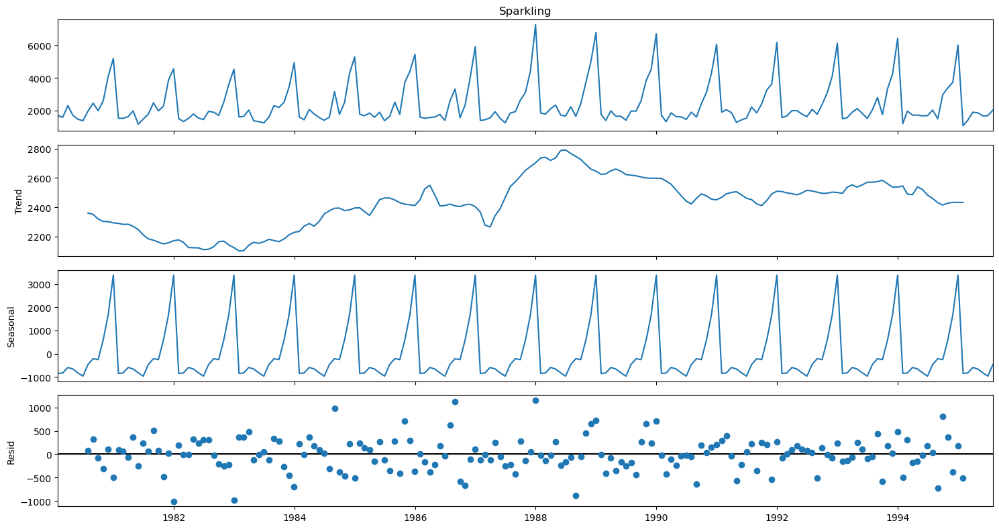

In [34]:
##Perform the decompostion of the time series using an additive model as a test
from    statsmodels.tsa.seasonal import   seasonal_decompose
decomposition = seasonal_decompose(df_final["Sparkling"],model='additive')
decomposition.plot();

In [35]:
###here we extract the individual elements of the time series and we can choose to look at the dara or not, I choose not to display it 

trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid


In [36]:
##looking at the residual mean
residual.mean()

-1.2088458994707845

<Axes: xlabel='resid', ylabel='Density'>

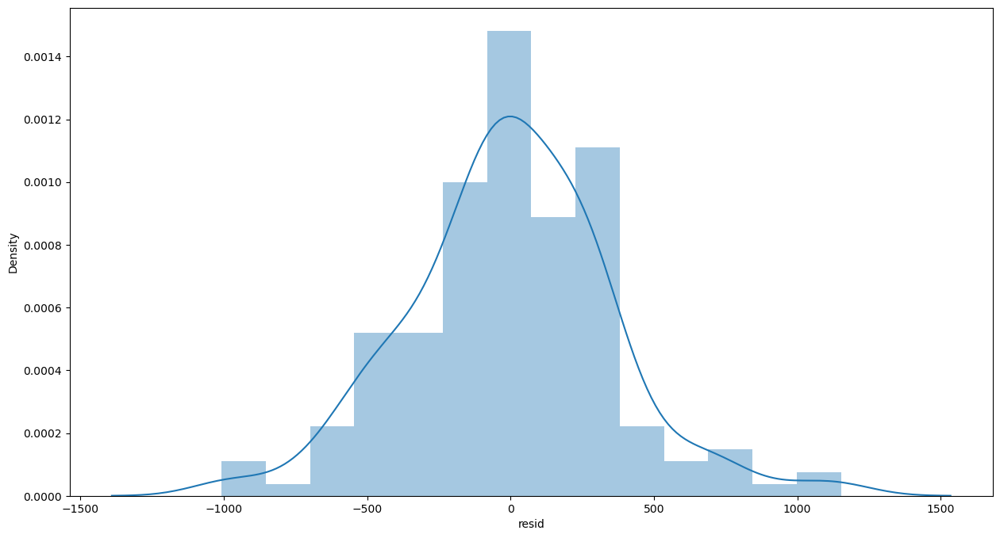

In [37]:
## we plot the residuals as they are supposed to be normal accoridng to the assuomptions of the time series models
sns.distplot(residual)

In [38]:
#we use a shapiro test to see if the additive model is actually the best fit. If it the best fit then the residuals will be normal. H0 of the Shapiro test states that the population is normally distributed
from scipy.stats import shapiro
if shapiro(residual.dropna())[1] > 0.05:
    print("The distribution is normally ditributed and the time series is additive")
else:
    print("The distribution is not normally ditributed and the time series is not additive")

The distribution is not normally ditributed and the time series is not additive


##### Multiplicative Decomposition

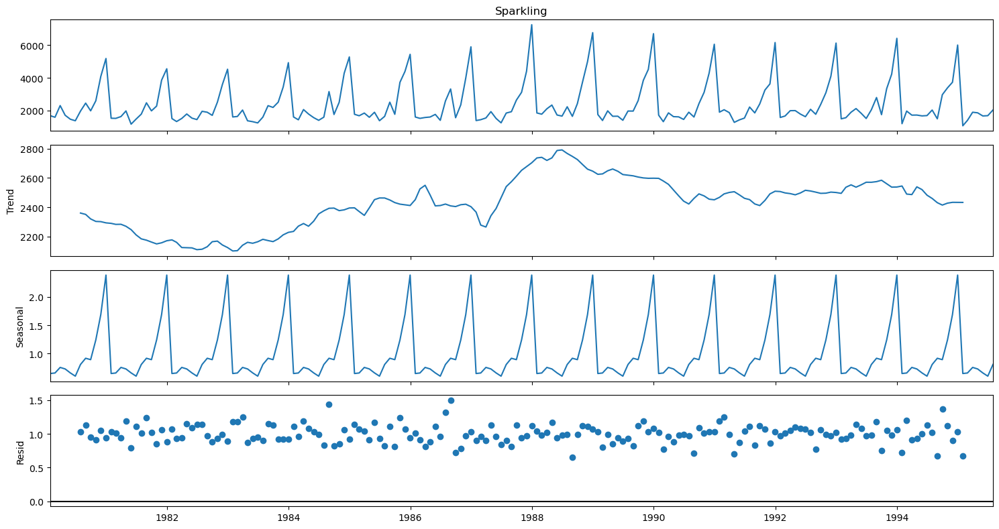

In [39]:
##Decompoisng the series into its individual components using the multiplicativbe decomposition 
decomposition = seasonal_decompose(df_final["Sparkling"],model='multiplicative')
decomposition.plot();

In [40]:
###here we extract the individual elements of the time series and we can choose to look at the dara or not, I choose not to display it 

trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid


In [41]:
##looking at the residual mean
residual.mean()

0.9997456359115033

<Axes: xlabel='resid', ylabel='Density'>

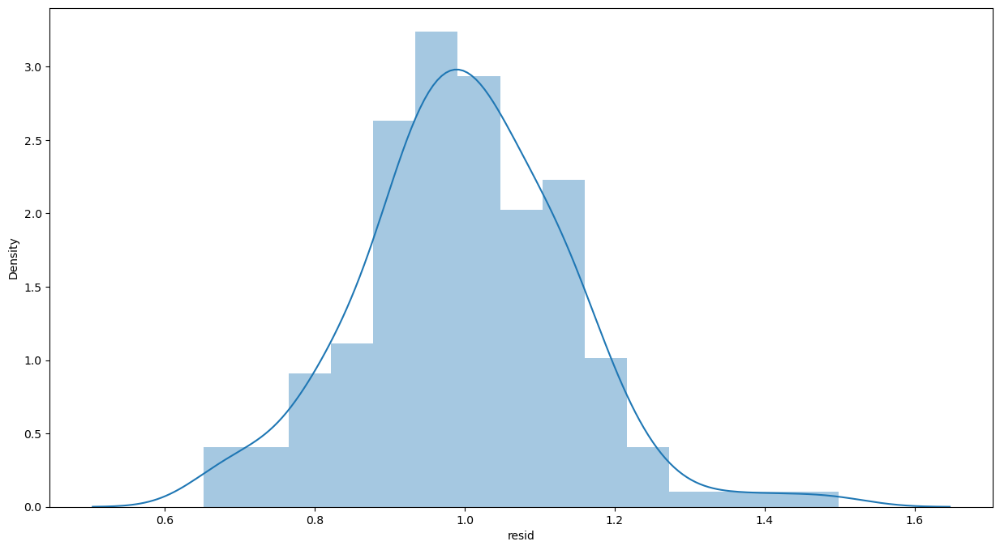

In [42]:
##Normality Distribution distribution 
from scipy.stats import shapiro

sns.distplot(residual)

In [43]:
#we use a shapiro test to see if the multiplicative model is actually the best fit. If it the best fit then the residuals will be normal. H0 of the Shapiro test states that the population is normally distributed

if shapiro(residual.dropna())[1] > 0.05:
    print("The distribution is normally ditributed and the time series is multiplicative")
else:
    print("The distribution is not normally ditributed and the time series is not multiplicative")

The distribution is normally ditributed and the time series is multiplicative


### Observations

The decomposition shows the following:

1. Trend: there is a general upward trend in the data 
2. Seasonality: There is clear seasonality in the data 
3. Errors: The error terms exhibit no clear pattern which is what we want 
4. We can see that the multiplicative series makes more sense and decomposes the data better as exepcted from our EDA on the quarterly trend
5. The time series is multiplicative

We can see that a lot of the residuals for the multiplicatove series are around one and therefore we choose multiplicative decomposition 

## Data Preparation for Modeling


We begin our data preparation for the modeling by:

1. Checking for any outliers in the data and how we would want to treat them
2. Splitting the data into our test and train set for training 

#### OUTLIER DETECTION
Outliers can affect how our model performs. In this case since we have identified that Q4 as higher than usual sales and that the distrbution of the data is right skewed I am expecting the outliers to be informative. We write code to identify outliers in the data and look at how we treat the outliers. 
From the EDA we can see that the data is right skewed showing that the sales are mostly at the lower end. 
We do the following to identify outliers:


1. We plot a box plot of the Sales to visually identify the sales of sparkling wine
2. We identify a threshold for the scores using the Z-score using a threshold of three to identify them 

In [44]:
##get re-accustomed with the data
df_final.head(4)

,Sparkling,Year,month,Quarter
date_time,,,,
1980-01-31,1686,1980,1,1
1980-02-29,1591,1980,2,1
1980-03-31,2304,1980,3,1
1980-04-30,1712,1980,4,2


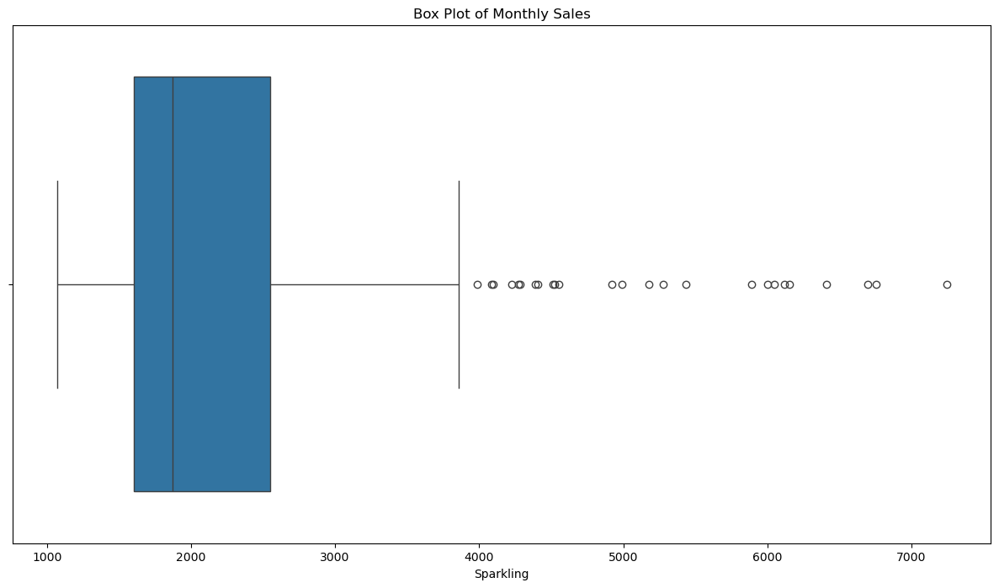

In [45]:
# Visual method: Box plot see if there are any outliers

sns.boxplot(x=df_final['Sparkling'])
plt.title('Box Plot of Monthly Sales')
plt.xlabel('Sparkling')
plt.show()



We can see that there is an existence of outliers (points that fall outside the "whiskers") in the data based on the boxplot on its default values. We now proceed to check for outliers using the Z-score. We have chosen the cutoff to be 3 standard deviations from the mean. So any value found over or below 3 standard deviations from the mean will be considered an outlier though we do not expect any values to be under as the distribution is right-skewed

In [46]:
# Statistical method: Z-score
# Calculate Z-scores
df_final['Z_score'] = np.abs((df_final['Sparkling'] - df_final['Sparkling'].mean()) / 
                                   df_final['Sparkling'].std())

# Define a threshold for outliers, usually a Z-score of 3 or -3 is considered as an outlier
#we do not need to check for the ones 3 standard deviations less than the mean since our distribution is skewed. 
outliers = df_final[np.abs(df_final['Z_score']) > 3]
outliers



,Sparkling,Year,month,Quarter,Z_score
date_time,,,,,
1987-12-31,7242,1987,12,4,3.736808
1988-12-31,6757,1988,12,4,3.362323
1989-12-31,6694,1989,12,4,3.313678
1993-12-31,6410,1993,12,4,3.094392


The Z-score measures how far a data point is from the mean of a dsitribution. We have identified three 4 values with a z-score greater than 3.These points lie 3 points from the mean of the sales. The outliers are in the month of December and coincide with a large number of sales. From the inspection of the time series we would expect outliers in December which seems to imply seasonality in the sales and therefore the values contian important information that we would need to use to model. 

Outliers can be treated using the following three options:

1. Keep them:       We assume they have important information and we do nothing to them 
2. Remove them:     We could remove them and assume they do not contain any information 
3. Transform them:  Since we are running projections and the outliers are seasonal and they contain information about the data structure we can apply a transformation to the data to reduce the impact of the outliers. We can use a log transfomation or clip the values to the nearest acceptble threshold. 

In this case we decide to clip the values so that no points lie beyond the boundary values. We caluclate our boundary values and replace the outliers with this maximum value



In [47]:
highest_allowed = df_final['Sparkling'].mean() + 3*df_final['Sparkling'].std()
lowest_allowed = df_final['Sparkling'].mean() - 3*df_final['Sparkling'].std()

print(f""" The highest allowed values is {highest_allowed} and the lowest allowed value is {lowest_allowed}""")

 The highest allowed values is 6287.751731499824 and the lowest allowed value is -1482.9175069008938


In [48]:
#clipping the values in the column Sparkling to the maximum value 6287
df_final["Sparkling_Clipped"] = df_final["Sparkling"].clip(upper = 6287)

- There are no more data points that lie 3 standard deviations from the mean of our original dataset as all values have been clipped to below this value and there are no longer any outliers

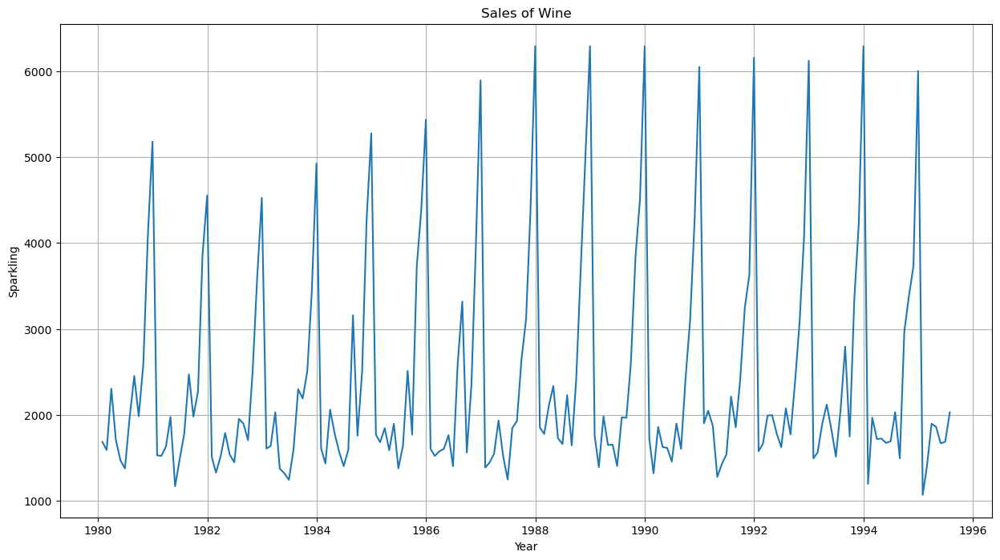

In [49]:
##Plot the new clipped sparkling series 
rcParams['figure.figsize'] = 15,8
plt.plot(df_final["Sparkling_Clipped"]);
plt.title("Sales of Wine")
plt.ylabel('Sparkling')
plt.xlabel('Year')
plt.grid()

##### Splitting into train and test

To train the models we split the data into training and testing datasets.

In [50]:
###check what df_final looks like now 
df_final.head(2)


,Sparkling,Year,month,Quarter,Z_score,Sparkling_Clipped
date_time,,,,,,
1980-01-31,1686,1980,1,1,0.553170,1686
1980-02-29,1591,1980,2,1,0.626523,1591


In [51]:
#look at the unique years in the data 
df_final.index.year.unique()

Int64Index([1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990,
            1991, 1992, 1993, 1994, 1995],
           dtype='int64', name='date_time')

We are projecting the sales for a 12 month or one year period and it is common practice for the model choices to be built on a duration longer than what we are projecting for to ensure stability of projections. In this case since 1995 is not a full year we will choose our best model based on the best performing model projecting the next 3 years and 7 months, i.e. 


train : Data from 1980 until 1991 (12 years of training data)
test  : Data from 1990 till 1995 since (3 years 7 months)

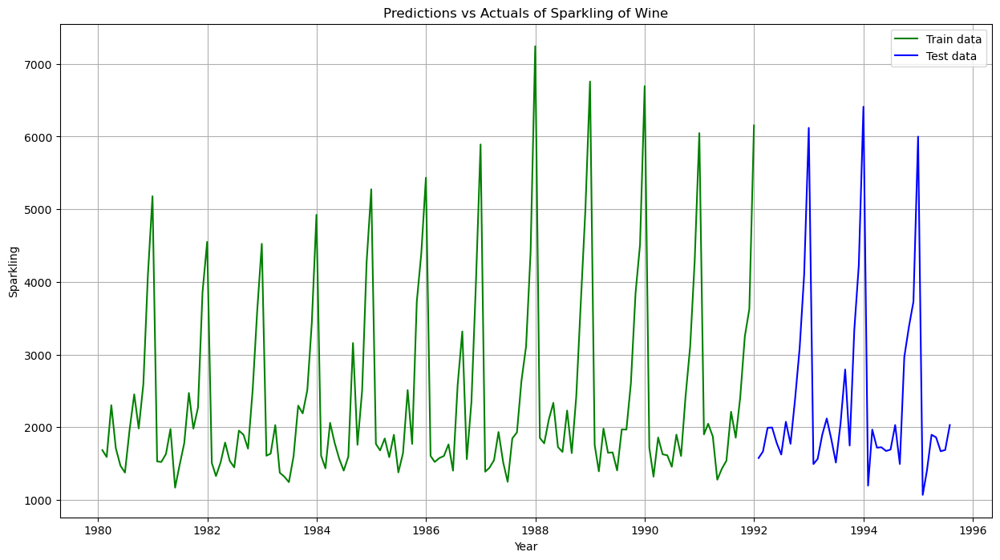

In [52]:
####

# Split train-test set manually as mentioned in the notes the test data will be from 1992 till the end

train_data = df_final[df_final.index.year <= 1991]
test_data = df_final[df_final.index.year > 1991]

##we keep the original series in there for our predictions and to compare the results later 
## we selected clipped and the original dataset
train_data = train_data[['Sparkling_Clipped', 'Sparkling']]
test_data = test_data[['Sparkling_Clipped', 'Sparkling']]
# Plot train-test using matplotlib.pyplot

plt.grid(False)
plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("Predictions vs Actuals of Sparkling of Wine")
plt.plot(train_data['Sparkling'], 'green', label='Train data')
plt.plot(test_data['Sparkling'], 'blue', label='Test data')
plt.legend()
plt.grid();


In [53]:
##look at the shapes of the test and train dataset
print(train_data.shape)
print(test_data.shape)

(144, 2)
(43, 2)


In [54]:
###look at what the train_data set looks like 
train_data.head(3)

,Sparkling_Clipped,Sparkling
date_time,,
1980-01-31,1686,1686
1980-02-29,1591,1591
1980-03-31,2304,2304


## Model Building 

###  Building our models 



We will build the following models and select which ones to use for forecasting. 
We build the following models:

1. Linear regression
2. Naive Forecast
3. Simple Average (Automated and Hyper-parameter search)
4. Exponential Smoothing (Simple, Double, Triple) (Automated and Hyper-parameter Search) 
4. Automated ARIMA
5. Automated SARIMA

Within each group of models we build the model and select the one with the lowest AIC. 

#### Model 1 Linear Regression

This model will serve as our baseline model. In order to create the regression model, we create a time variable and make this the dependent variable with the sparkling sales as the independent variable. 

In [55]:
##Get the number of rows in the data or dates in the train_data
train_data.shape[0]

144

In [56]:
"""
To get the time step for each individual train and test we get the shape from the time and test so that when we use predict on 
the train the model knows we are on the next timestamp and the order of the time series is preserved

I prefer using the shape parameter as this allows me to potentially change my code in terms of the split percentage without having to manually find parameters

"""


train_time = [i+1 for i in range(len(train_data))]
test_time = [i+1+ train_data.shape[0] for i in range(len(test_data))]
print('Training Time instance','\n',train_time)
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144]
Test Time instance 
 [145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [57]:
### we create a copy of the data for the models 



LinearRegression_train = train_data.copy()
LinearRegression_test = test_data.copy()

LinearRegression_train['time'] = train_time
LinearRegression_test['time'] = test_time


print('First few rows of Training Data','\n',LinearRegression_train.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test.tail(),'\n')

First few rows of Training Data 
             Sparkling_Clipped  Sparkling  time
date_time                                     
1980-01-31               1686       1686     1
1980-02-29               1591       1591     2
1980-03-31               2304       2304     3
1980-04-30               1712       1712     4
1980-05-31               1471       1471     5 

Last few rows of Training Data 
             Sparkling_Clipped  Sparkling  time
date_time                                     
1991-08-31               1857       1857   140
1991-09-30               2408       2408   141
1991-10-31               3252       3252   142
1991-11-30               3627       3627   143
1991-12-31               6153       6153   144 

First few rows of Test Data 
             Sparkling_Clipped  Sparkling  time
date_time                                     
1992-01-31               1577       1577   145
1992-02-29               1667       1667   146
1992-03-31               1993       1993   147
1992-0

In [58]:
### we fit the linear model 
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(LinearRegression_train[['time']],LinearRegression_train['Sparkling_Clipped'].values)

LinearRegression()

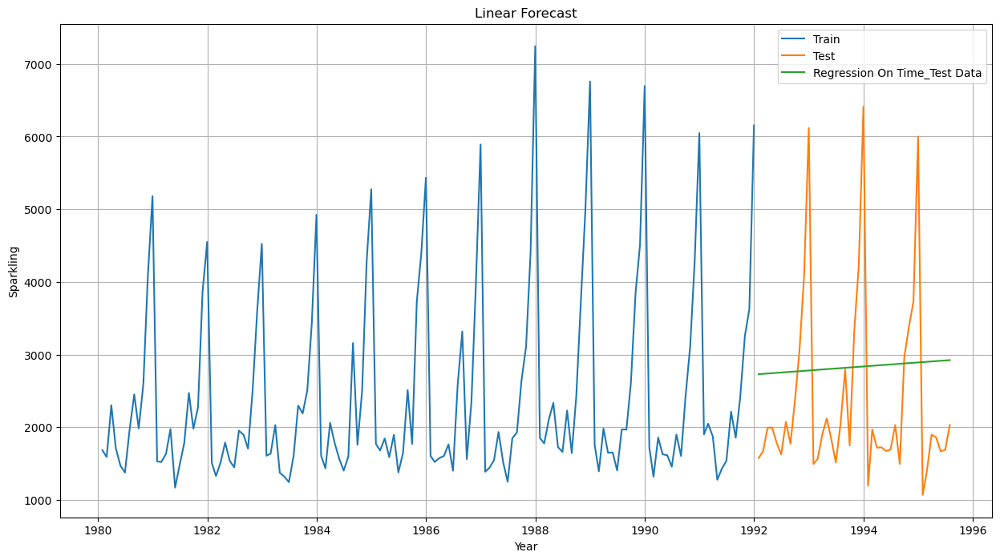

In [59]:

#we run the predictions 
test_predictions_model1         = lr.predict(LinearRegression_test[['time']])

LinearRegression_test['RegOnTime'] = (test_predictions_model1)

### We plot the predictions on the graph 

plt.plot( train_data['Sparkling'], label='Train')
plt.plot(test_data['Sparkling'], label='Test')
plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time_Test Data')
plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("Linear Forecast")
plt.legend(loc='best')
plt.grid();

#### Model Evaluation

In [60]:
from sklearn import metrics

## Test Data - RMSE

rmse_model1_test = metrics.mean_squared_error(test_data['Sparkling'], (test_predictions_model1) ,squared=False)
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.3f" %(rmse_model1_test))

resultsDf = pd.DataFrame({'Test RMSE': [rmse_model1_test]},index=['RegressionOnTime'])
resultsDf

For RegressionOnTime forecast on the Test Data,  RMSE is 1344.645


,Test RMSE
RegressionOnTime,1344.644564


The linear model performs poorly on the dataset.

#### Model 2 Naive Regression 

In this method we assume that the value for tomorrow is the same as the one for today and so on.

In [61]:
##create the test and train data copies
NaiveModel_train = train_data.copy()
NaiveModel_test = test_data.copy()

In [62]:
#taking the last value as the "prediction" for the naive model
NaiveModel_test['naive'] = np.asarray(train_data['Sparkling_Clipped'])[len(np.asarray(train_data['Sparkling_Clipped']))-1]
NaiveModel_test['naive'].head()

date_time
1992-01-31    6153
1992-02-29    6153
1992-03-31    6153
1992-04-30    6153
1992-05-31    6153
Name: naive, dtype: int64

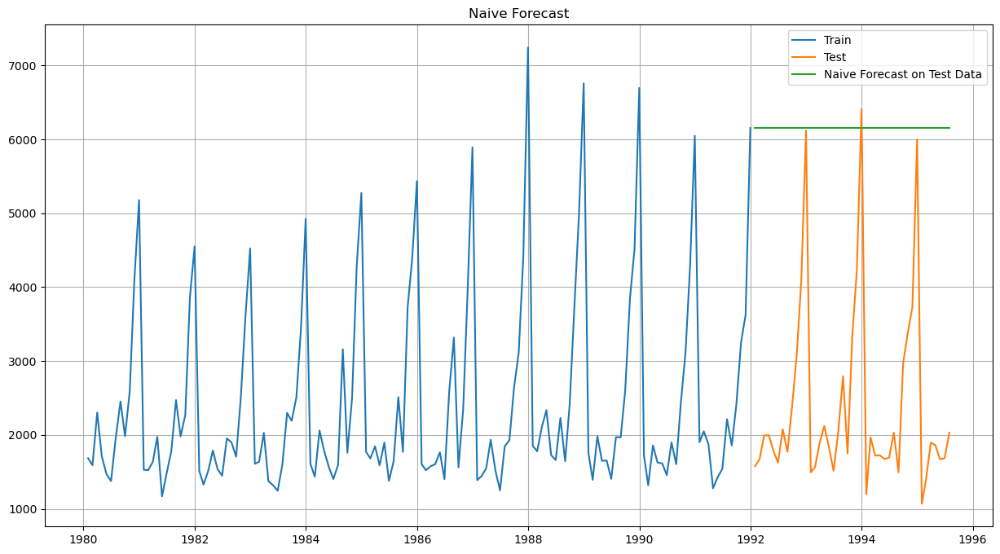

In [63]:
## we plot the data

plt.plot(NaiveModel_train['Sparkling'], label='Train')
plt.plot(test_data['Sparkling'], label='Test')
plt.plot(NaiveModel_test['naive'], label='Naive Forecast on Test Data')
plt.legend(loc='best')
plt.title("Naive Forecast")
plt.grid();

#### Model Evaluation

In [64]:
## Test Data - RMSE

rmse_model2_test = metrics.mean_squared_error(test_data['Sparkling'],NaiveModel_test['naive'],squared=False)
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.3f" %(rmse_model2_test))

For RegressionOnTime forecast on the Test Data,  RMSE is 3979.915


In [65]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_model2_test]},index=['NaiveModel'])

resultsDf = pd.concat([resultsDf, resultsDf_2])
resultsDf

,Test RMSE
RegressionOnTime,1344.644564
NaiveModel,3979.914692


As expected the naive model performs poorly on the data 

### Model 3 Simple Average

This method uses the average of the training values 

In [66]:
SimpleAverage_train = train_data.copy()
SimpleAverage_test = test_data.copy()

In [67]:
SimpleAverage_test['mean_forecast'] = train_data['Sparkling_Clipped'].mean()
SimpleAverage_test.head()

,Sparkling_Clipped,Sparkling,mean_forecast
date_time,,,
1992-01-31,1577,1577,2396.208333
1992-02-29,1667,1667,2396.208333
1992-03-31,1993,1993,2396.208333
1992-04-30,1997,1997,2396.208333
1992-05-31,1783,1783,2396.208333


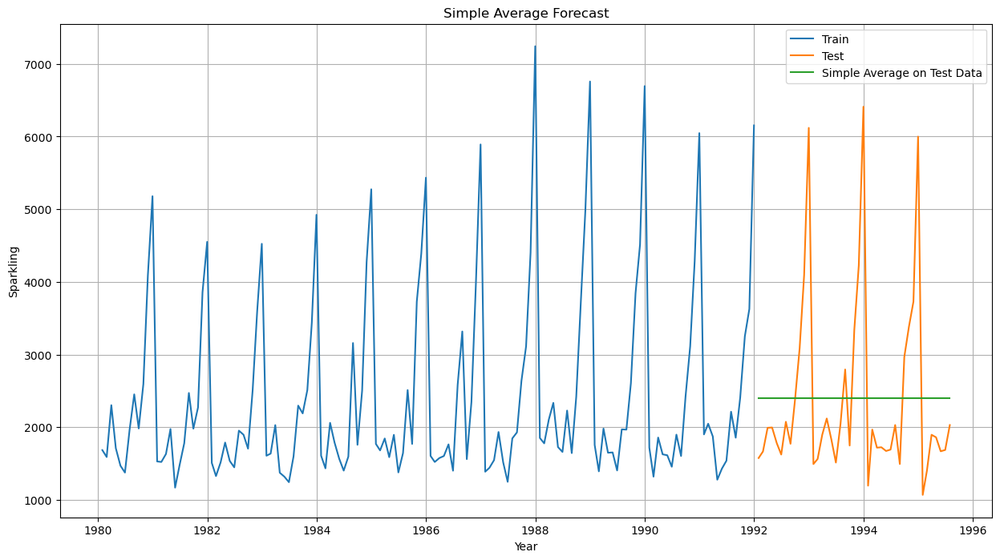

In [68]:
#plotting the predictions on one graph
plt.plot(SimpleAverage_train['Sparkling'], label='Train')
plt.plot(SimpleAverage_test['Sparkling'], label='Test')
plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average on Test Data')
plt.legend(loc='best')
plt.title("Simple Average Forecast")
plt.xlabel('Year')
plt.ylabel('Sparkling')

plt.grid();

##### Model Evaluation

In [69]:
## We Evaluate the model perfromance 

rmse_model3_test = metrics.mean_squared_error(test_data['Sparkling'],SimpleAverage_test['mean_forecast'],squared=False)
print("For Simple Average forecast on the Test Data,  RMSE is %3.3f" %(rmse_model3_test))

For Simple Average forecast on the Test Data,  RMSE is 1268.463


In [70]:
resultsDf_3 = pd.DataFrame({'Test RMSE': [rmse_model3_test]},index=['SimpleAverageModel'])

resultsDf = pd.concat([resultsDf, resultsDf_3])
resultsDf

,Test RMSE
RegressionOnTime,1344.644564
NaiveModel,3979.914692
SimpleAverageModel,1268.462755


### Model 4 Simple Exponetial Model 

Simple Exponential smoothing is a simple model as the name implies. This method assumes that a time series has the following:

-  Level
- No trends
- No seasonality
- Noise


According to the National Institure of Standards and technology it is often best to estimate the value ot the alpha parameter used when running the model. The alpha value determines how much prior data points influence the predction of the next value or are used to predict. A value of alpha = 1 means that prior data points enter less into the smooth.

The process will be to run the automatic fit of the model then do a grid search over variables, the automatic model will give an idea of the parameter space we can choose adn can serve as a good intuitive guide as to the model

In [71]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
##create a train and test dataset
SES_train = train_data.copy()
SES_test = test_data.copy()

##### Automated SES

In [72]:

model_SES = SimpleExpSmoothing(SES_train['Sparkling_Clipped'])

In [73]:
###fit the automated SES
model_SES_autofit = model_SES.fit(optimized=True, use_brute=True)
##print out the autofit model parameters 
model_SES_autofit.params

{'smoothing_level': 0.03701387488898935,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [74]:
##get a summary of the model perfromance 
model_SES_autofit.summary()

Dep. Variable:,Sparkling_Clipped,No. Observations:,144
Model:,SimpleExpSmoothing,SSE,234511560.409
Optimized:,True,AIC,2063.661
Trend:,None,BIC,2069.601
Seasonal:,None,AICC,2063.949
Seasonal Periods:,None,Date:,"Sun, 29 Oct 2023"
Box-Cox:,False,Time:,18:00:33
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.0370139,alpha,True
initial_level,1686.0000,l.0,False


In [75]:
##run predicitons on the data
SES_test['auto_predict'] = model_SES_autofit.forecast(steps=len(test_data))

In [76]:
###take a look at our SES_test data
SES_test.head()

,Sparkling_Clipped,Sparkling,auto_predict
date_time,,,
1992-01-31,1577,1577,2621.167381
1992-02-29,1667,1667,2621.167381
1992-03-31,1993,1993,2621.167381
1992-04-30,1997,1997,2621.167381
1992-05-31,1783,1783,2621.167381


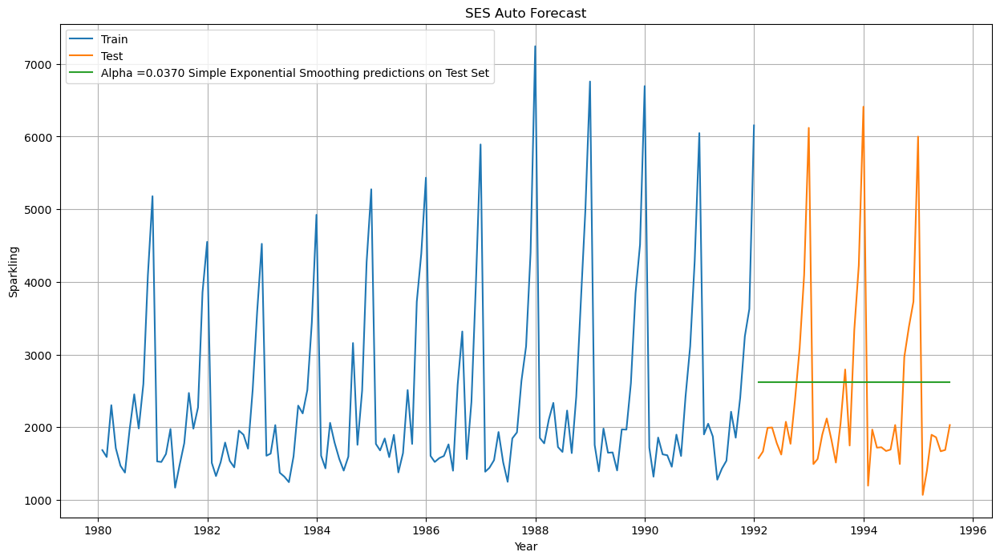

In [77]:
## Plotting on both the Training and Test data


plt.plot(SES_train['Sparkling'], label='Train')
plt.plot(SES_test['Sparkling'], label='Test')



plt.plot((SES_test['auto_predict']), label='Alpha =0.0370 Simple Exponential Smoothing predictions on Test Set')

plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("SES Auto Forecast")


plt.legend(loc='best')
plt.grid();

#### Model Evaluation

In [78]:
###Evaluating the model accuracy of the autofitted model 
rmse_model_auto_SES = metrics.mean_squared_error(SES_test['Sparkling'],(SES_test['auto_predict']),squared=False)


In [79]:
##evaluate auto SES 
resultsDf_auto_SES = pd.DataFrame({'Test RMSE': [rmse_model_auto_SES]},index=['auto_SES,Alpha =0.0370'])   # Complete the code to check the perfromance of the 'Alpha = 0.05,SimpleExponentialSmoothing' 
resultsDf = pd.concat([resultsDf, resultsDf_auto_SES])
resultsDf


,Test RMSE
RegressionOnTime,1344.644564
NaiveModel,3979.914692
SimpleAverageModel,1268.462755
"auto_SES,Alpha =0.0370",1290.978200


##### Hyper-parameter search

We conduct a search for the best parameters for the SES model. In this case we are searching for the alpha value

In [80]:
## We will now create an empty frame to pass the results in 

resultsDf_SES = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_SES

,Alpha Values,Train RMSE,Test RMSE


In [81]:
for i in np.arange(0.1,1,0.1):
    model_SES_alpha_i = model_SES.fit(smoothing_level=i,optimized=False,use_brute=True)
    SES_train['predict',i] = model_SES_alpha_i.fittedvalues
    SES_test['predict',i] = model_SES_alpha_i.forecast(steps=len(SES_test))
    
    rmse_model4_train_i = metrics.mean_squared_error(SES_train['Sparkling'],(SES_train['predict',i]),squared=False)
    
    rmse_model4_test_i = metrics.mean_squared_error(SES_test['Sparkling'],(SES_test['predict',i]),squared=False)
    
    resultsDf_SES = resultsDf_SES.append({'Alpha Values':i,'Train RMSE':rmse_model4_train_i 
                                      ,'Test RMSE':rmse_model4_test_i}, ignore_index=True)

#### Model Evaluation 

In [82]:
resultsDf_SES.sort_values(by =['Test RMSE'], ascending = True)

,Alpha Values,Train RMSE,Test RMSE
0,0.1,1332.559841,1356.185563
1,0.2,1350.607371,1573.611576
2,0.3,1350.051254,1900.040866
3,0.4,1339.105813,2260.068749
4,0.5,1326.469664,2606.296379
5,0.6,1317.231895,2924.118301
6,0.7,1313.280224,3214.744366
7,0.8,1314.955557,3483.731806
8,0.9,1322.275434,3736.981096


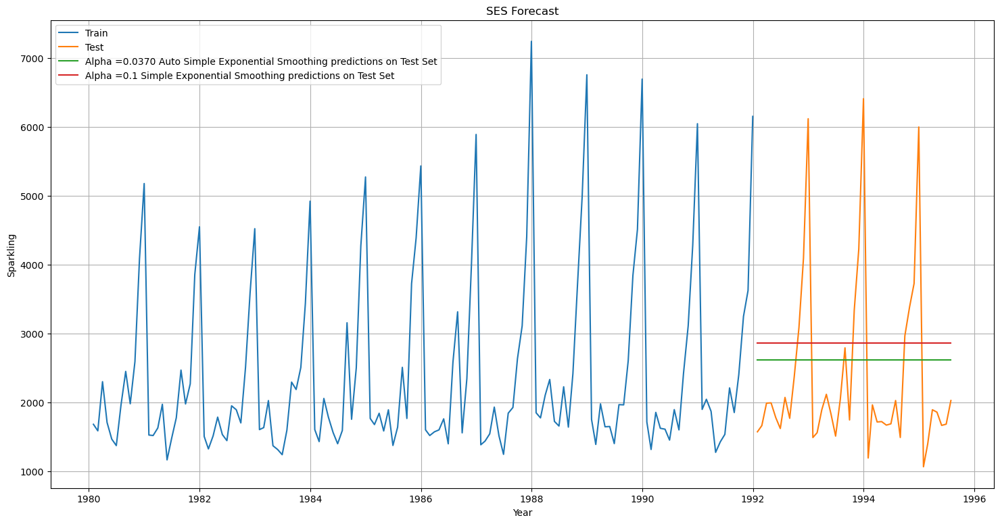

In [83]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(SES_train['Sparkling'], label='Train')
plt.plot(SES_test['Sparkling'], label='Test')


plt.plot((SES_test['auto_predict']), label='Alpha =0.0370 Auto Simple Exponential Smoothing predictions on Test Set')

plt.plot((SES_test['predict', 0.1]), label='Alpha =0.1 Simple Exponential Smoothing predictions on Test Set')

plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("SES Forecast")

plt.legend(loc='best')
plt.grid();

In [84]:
resultsDf_4 = pd.DataFrame({'Test RMSE': [resultsDf_SES.sort_values(by =['Test RMSE'], ascending = True).values[0][2]]}
                           ,index=['Alpha=0.1,SimpleExponentialSmoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_4])
resultsDf

,Test RMSE
RegressionOnTime,1344.644564
NaiveModel,3979.914692
SimpleAverageModel,1268.462755
"auto_SES,Alpha =0.0370",1290.978200
"Alpha=0.1,SimpleExponentialSmoothing",1356.185563


The model from the hyperparameter search performs worser than the automatic model as it has a lower RMSE. Both models however, perfrom poorly. 

### Model 5 Double Exponential Smoothing (Holt's Model) 

This model is more reliable and it does well for handling data with trends and without seasonality. The model assumes that a time series has the following:

- Level
- Trends
- No seasonality
- Noise

This model accounts for alpha and beta which account for both the trend and the seasonality when modeling the data.

In [85]:
#creating a copy of test and training data
DES_train = train_data.copy()
DES_test = test_data.copy()

In [86]:
#runninf the DES AUTO MODEL
model_DES = Holt(DES_train['Sparkling_Clipped'])

In [87]:
##fitting the DES model
model_DES_autofit = model_DES.fit()

In [88]:
##Get to see the des parameters
model_DES_autofit.params

{'smoothing_level': 0.7357142857142857,
 'smoothing_trend': 0.0001,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': -95.0,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [89]:
##get a summary of the model parameters
model_DES_autofit.summary()

Dep. Variable:,Sparkling_Clipped,No. Observations:,144
Model:,Holt,SSE,243084031.818
Optimized:,True,AIC,2072.831
Trend:,Additive,BIC,2084.710
Seasonal:,None,AICC,2073.444
Seasonal Periods:,None,Date:,"Sun, 29 Oct 2023"
Box-Cox:,False,Time:,18:00:34
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.7357143,alpha,True
smoothing_trend,0.0001,beta,True


In [90]:
## Prediction on the test data

DES_test['auto_predict'] = model_DES_autofit.forecast(steps=len(test_data))
DES_test.head()

,Sparkling_Clipped,Sparkling,auto_predict
date_time,,,
1992-01-31,1577,1577,5314.317709
1992-02-29,1667,1667,5221.047215
1992-03-31,1993,1993,5127.776721
1992-04-30,1997,1997,5034.506227
1992-05-31,1783,1783,4941.235733


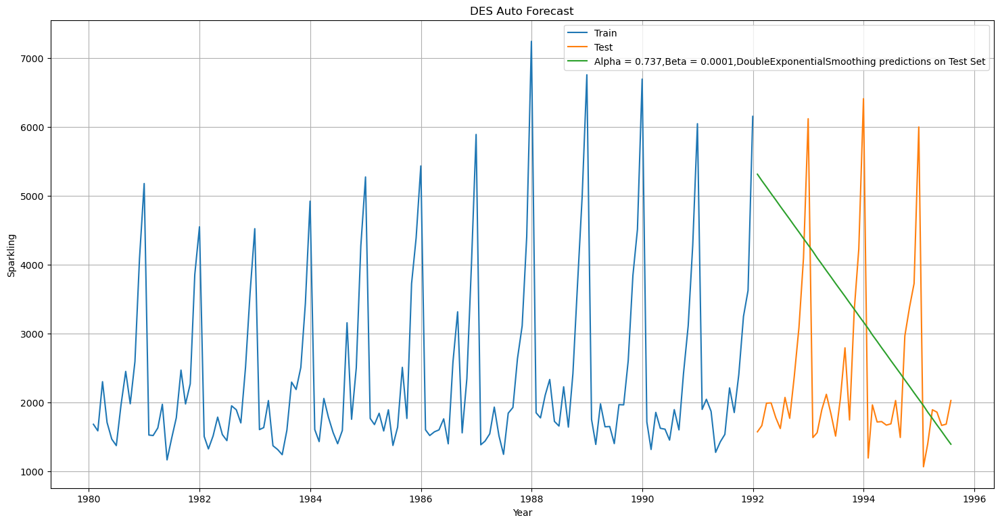

In [91]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(DES_train['Sparkling'], label='Train')
plt.plot(DES_test['Sparkling'], label='Test')

plt.plot((DES_test['auto_predict']), label='Alpha = 0.737,Beta = 0.0001,DoubleExponentialSmoothing predictions on Test Set')
plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("DES Auto Forecast")

plt.legend(loc='best')
plt.grid();

#### Model Evaluation

In [92]:
###Evaluating the model accuracy of the autofitted model 
rmse_model_auto_DES = metrics.mean_squared_error(DES_test['Sparkling'],(DES_test['auto_predict']),squared=False)


In [93]:

##evaluate auto model
resultsDf_auto_DES = pd.DataFrame({'Test RMSE': [rmse_model_auto_DES]},index=['auto_DES, Alpha = 0.737,Beta = 0.0001'])   # Complete the code to check the perfromance of the 'Alpha = 0.05,SimpleExponentialSmoothing' 
resultsDf = pd.concat([resultsDf, resultsDf_auto_DES])
resultsDf

,Test RMSE
RegressionOnTime,1344.644564
NaiveModel,3979.914692
SimpleAverageModel,1268.462755
"auto_SES,Alpha =0.0370",1290.978200
"Alpha=0.1,SimpleExponentialSmoothing",1356.185563
"auto_DES, Alpha = 0.737,Beta = 0.0001",1992.838366


##### Hyper-parameter Searched

There are a few parameters that we are searching for in thsi case:

1. smoothing_trend - this is our beta estimate
2. smoothing_level - this is the estimate of alpha and we take values from 0.1 to 0.9 
2. damping_trend - this determnes the phi value for the damping 
4. damped_trend - this determines whether or not to dampen the trend. Holts method tends to over-forcast Gardner & McKenzie (1985) introduced a method to dampen the trend line which improves accuracy
3. exponential - this is a boolean that shows whether or not the trend is exponential, i.e. is not linear
4. remove_bias  - forces average residual to zero removing bias from forecasts

We create a parameter grid as multiple for loops would make tracing changes difficult

In [94]:
## we search over the parameters and use the options to try find a better model than the one given by auto predicting
parameter_grid_DES = {'smoothing_level': [.10,.20,.30,.40,.50,.60,.70,.80,.90], 
                  'smoothing_trend':[.10,.20,.30,.40,.50,.60,.70,.80,.90],
                  'damping_trend': [.10,.20,.30,.40,.50,.60,.70,.80,.90],
                  'damped_trend': [True, False], 
                  'exponential': [True, False] , 
                   #'use_boxcox':[True, False],
                   'remove_bias':[True, False]}
pg_DES = list(ParameterGrid(parameter_grid_DES))

In [95]:
##create a data frame to store the results
resultsDf_DES = pd.DataFrame(columns=['index','smoothing_level', 'smoothing_trend', 'damping_trend','damped_trend','exponential','remove_bias','Train RMSE' ,'Test RMSE' ])


In [96]:
####running the hyper-parameter search over values

for a,b in enumerate(pg_DES):
    smoothing_level = b.get('smoothing_level')
    smoothing_trend = b.get('smoothing_trend')
    damping_trend = b.get('damping_trend')
    damped_trend = b.get('damped_trend')
    exponential = b.get('exponential')
    #use_boxcox = b.get('use_boxcox')
    remove_bias = b.get('remove_bias')
    
    ### we are setting new parameters so we fit a different model and not the one initialised above 
    model_DES_grid = Holt(DES_train['Sparkling_Clipped'], damped_trend=damping_trend, 
                                 exponential = exponential ).fit(
                                   smoothing_level=smoothing_level,
                                   smoothing_trend=smoothing_trend,
                                   optimized=False,
                                   use_brute=True, 
                                   damping_slope = damping_trend,
                                  
                                 
                                   #use_boxcox = use_boxcox,
                                   remove_bias = remove_bias
                                   )

    ##we reference the predicitons using the enumerated number a so we can automatically reference the model
    DES_train['predict', a] = model_DES_grid.fittedvalues
    DES_test['predict', a] = model_DES_grid.forecast(steps=len(DES_test))


    ####we caluclate the error 
    rmse_model5_train = metrics.mean_squared_error(DES_train['Sparkling'],(DES_train['predict',a]),squared=False)
        
    rmse_model5_test = metrics.mean_squared_error(DES_test['Sparkling'],(DES_test['predict',a]),squared=False)

    #we append the results to the dataframe
    resultsDf_DES = resultsDf_DES.append({'index':a,'smoothing_level':smoothing_level, 'smoothing_trend':smoothing_trend, 'damping_trend':damping_trend, 
                                           'damped_trend':damped_trend, 'exponential':exponential,'remove_bias':remove_bias, 'Train RMSE':rmse_model5_train,
                                          'Test RMSE':rmse_model5_test}, ignore_index=True)


#### Model Evaluation

In [97]:
#we look at the sorted values in the table 
resultsDf_DES.sort_values(by =['Test RMSE'], ascending = True).head()

,index,smoothing_level,smoothing_trend,damping_trend,damped_trend,exponential,remove_bias,Train RMSE,Test RMSE
243,243,0.1,0.1,0.1,True,False,False,1333.046440,1357.769783
3159,3159,0.1,0.1,0.1,False,False,False,1333.046440,1357.769783
81,81,0.1,0.1,0.1,True,True,False,1333.115094,1358.182750
2997,2997,0.1,0.1,0.1,False,True,False,1333.115094,1358.182750
3160,3160,0.1,0.2,0.1,False,False,False,1333.420423,1359.373198


Our model from the hyper-parameter search performs better than the automatic model 

In [98]:
#we add the 
resultsDf_DES_RMSE = pd.DataFrame({'Test RMSE': [resultsDf_DES.sort_values(by =['Test RMSE'], ascending = True).values[0][-1]]}
                           ,index=['Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing'])   # Complete the code to check the perfromance of the 'Alpha=0.6,Beta=0.00010,DoubleExponentialSmoothing' 

resultsDf = pd.concat([resultsDf, resultsDf_DES_RMSE])
resultsDf

,Test RMSE
RegressionOnTime,1344.644564
NaiveModel,3979.914692
SimpleAverageModel,1268.462755
"auto_SES,Alpha =0.0370",1290.978200
"Alpha=0.1,SimpleExponentialSmoothing",1356.185563
"auto_DES, Alpha = 0.737,Beta = 0.0001",1992.838366
"Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing",1357.769783


In [99]:
# we get the index of the best model 
index_best_model = resultsDf_DES.sort_values(by =['Test RMSE'], ascending = True).values[0][0]
print(index_best_model)

243


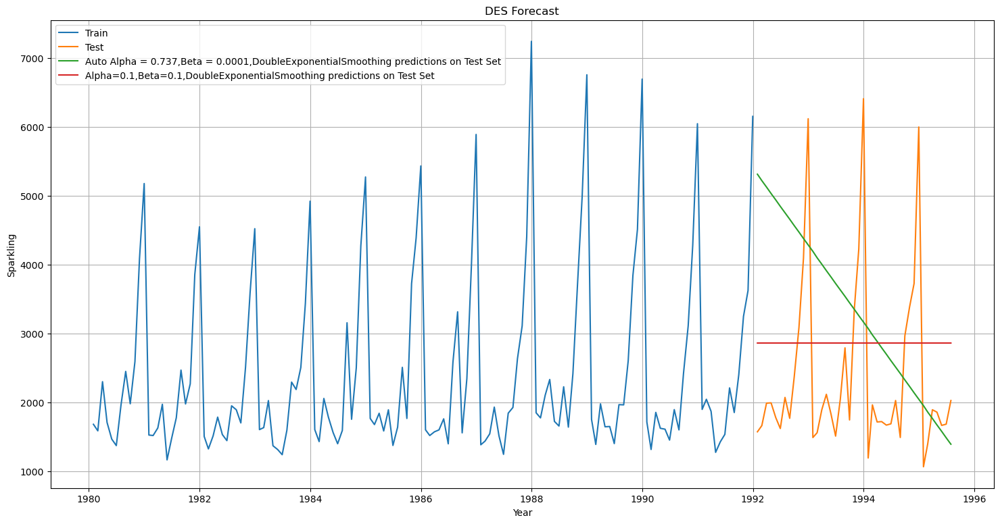

In [100]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(DES_train['Sparkling'], label='Train')
plt.plot(DES_test['Sparkling'], label='Test')


plt.plot((DES_test['auto_predict']), label='Auto Alpha = 0.737,Beta = 0.0001,DoubleExponentialSmoothing predictions on Test Set')

plt.plot((DES_test['predict', index_best_model]), label='Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing predictions on Test Set')

plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("DES Forecast")

plt.legend(loc='best')
plt.grid();

### Model 6 Triple Exponential Smoothing (Holt's Winter Model) 

This model accounts for a time series that has the following:

- Level
- Trends
- Seasonality
- Noise


Holt-Winter model is an extension of Holt's model. This takes into account all the 3 time-series components (level, trend and seasonality). The seasonality component of time series is an important component since most real-world data have a seasonal period and our own dataset has seasonality

In [101]:
###copy the triasning data and create a test and train setr for TES
TES_train = train_data.copy()
TES_test = test_data.copy()

In [102]:
###running the automated method of the TES model
model_TES = ExponentialSmoothing(TES_train['Sparkling_Clipped'],trend='additive',seasonal='multiplicative',freq='M')

In [103]:
#fitting the model of the TES model
model_TES_autofit = model_TES.fit()

In [104]:
##plotting the parameters of the TES model 
model_TES_autofit.params

{'smoothing_level': 0.07701610430072522,
 'smoothing_trend': 0.07701605070081585,
 'smoothing_seasonal': 0.3065302280420654,
 'damping_trend': nan,
 'initial_level': 2352.9228257009327,
 'initial_trend': -17.212966724780642,
 'initial_seasons': array([0.72064637, 0.68483917, 0.89951413, 0.79977507, 0.65732154,
        0.64684222, 0.87989367, 1.13119067, 0.91746882, 1.23548594,
        1.90475453, 2.43819161]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [105]:
#summary of the autofit model 
model_TES_autofit.summary()

Dep. Variable:,Sparkling_Clipped,No. Observations:,144
Model:,ExponentialSmoothing,SSE,15804226.424
Optimized:,True,AIC,1703.260
Trend:,Additive,BIC,1750.777
Seasonal:,Multiplicative,AICC,1708.732
Seasonal Periods:,12,Date:,"Sun, 29 Oct 2023"
Box-Cox:,False,Time:,18:01:02
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.0770161,alpha,True
smoothing_trend,0.0770161,beta,True


In [106]:
##PREDICTION ON TEST SET
TES_test['auto_predict'] = model_TES_autofit.forecast(steps=len(test_data))
TES_test.head()

,Sparkling_Clipped,Sparkling,auto_predict
date_time,,,
1992-01-31,1577,1577,1717.578944
1992-02-29,1667,1667,1606.141073
1992-03-31,1993,1993,1807.445563
1992-04-30,1997,1997,1563.969913
1992-05-31,1783,1783,1525.479013


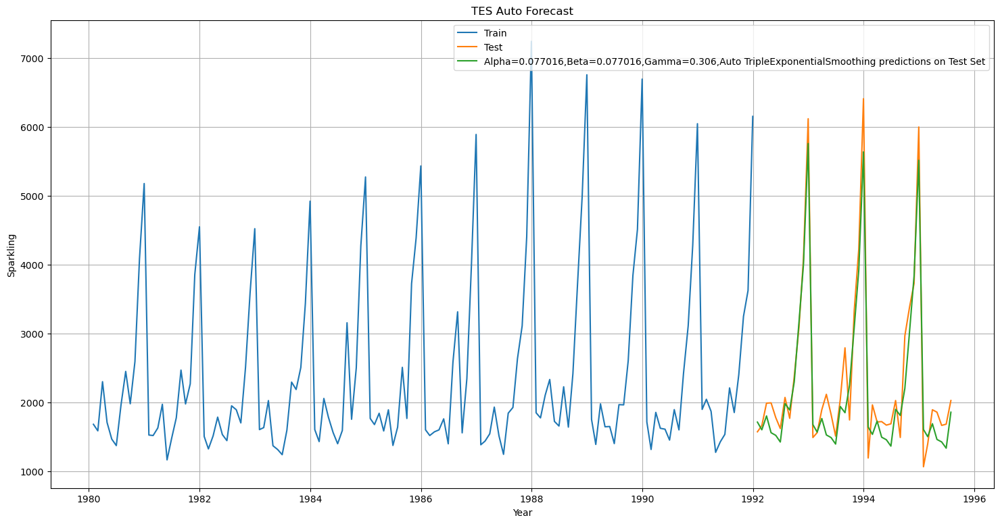

In [107]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(TES_train['Sparkling'], label='Train')
plt.plot(TES_test['Sparkling'], label='Test')


plt.plot(TES_test['auto_predict'], label='Alpha=0.077016,Beta=0.077016,Gamma=0.306,Auto TripleExponentialSmoothing predictions on Test Set')
plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("TES Auto Forecast")

plt.legend(loc='best')
plt.grid();

#### Model Evaluation

In [108]:
###Evaluating the model accuracy of the autofitted model 
rmse_model_auto_TES = metrics.mean_squared_error(TES_test['Sparkling'],(TES_test['auto_predict']),squared=False)


##evaluate auto model
resultsDf_auto_TES = pd.DataFrame({'Test RMSE': [rmse_model_auto_TES]},index=['auto_TES, Alpha=0.077016,Beta=0.077016,Gamma=0.306'])   # Complete the code to check the perfromance of the 'Alpha = 0.05,SimpleExponentialSmoothing' 
resultsDf = pd.concat([resultsDf, resultsDf_auto_TES])
resultsDf

,Test RMSE
RegressionOnTime,1344.644564
NaiveModel,3979.914692
SimpleAverageModel,1268.462755
"auto_SES,Alpha =0.0370",1290.978200
"Alpha=0.1,SimpleExponentialSmoothing",1356.185563
"auto_DES, Alpha = 0.737,Beta = 0.0001",1992.838366
"Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing",1357.769783
"auto_TES, Alpha=0.077016,Beta=0.077016,Gamma=0.306",351.507911


#### Hyper-parameter search

There are a few parameters that we are searching for in thsi case:

1. smoothing_trend - this is our beta estimate
2. smoothing_level - this is the estimate of alpha and we take values from 0.1 to 0.9 
3. damping_trend - this determnes the phi value for the damping 
4. damped_trend - this determines whether or not to dampen the trend. Holts method tends to over-forcast Gardner & McKenzie (1985) introduced a method to dampen the trend line which improves accuracy
5. smoothing_seasonal - this is our gamma estimate for the model 
6. seasonal - whether the season is additve or multiplicative 
7. seasonal_periods - the number of periods to complete a cycle 
8. trend - whether the trend is multiplicative or additive


We create a parameter grid as multiple for loops would make tracing changes difficult

In [109]:
##Creating the parameter grid for the TES model 
param_grid_TES = {'trend': ['add', 'mul'], 
                   'seasonal' :[ 'mul'],  #we know that we have multiplicative seasonality
                  'seasonal_periods':[12], #we know our seasonality is 12 from the decomposition
                  'smoothing_level': [.10,.20,.30,.40,.50,.60,.70,.80,.90],  
                  'smoothing_trend':[.10,.20,.30,.40,.50,.60,.70,.80,.90],   
                  'damping_trend': [.10,.20,.30,.40,.50,.60,.70,.80,.90],   
                  'smoothing_seasonal': [.10,.20,.30,.40,.50,.60,.70,.80,.90], 
                  'damped_trend' : [True, False], 
                  #'use_boxcox':[True, False], 
                 # 'remove_bias':[True, False],
                  #'use_basinhopping':[True, False]
                  }
pg_TES = list(ParameterGrid(param_grid_TES))

In [110]:
##Creating the dataframe to store the results of the hyper-parameter search
df_results_TES = pd.DataFrame(columns=['index','trend','seasonal_periods','seasonal','smoothing_level', 'smoothing_trend','smoothing_seasonal',
                                        'damped_trend','damping_trend','Train RMSE' ,'Test RMSE'])

In [111]:
###running the hyper-parameter search 
for a,b in enumerate(pg_TES):
    trend = b.get('trend')
    seasonal = b.get('seasonal')
    smoothing_level = b.get('smoothing_level')
    seasonal_periods = b.get('seasonal_periods')
    smoothing_level = b.get('smoothing_level')
    smoothing_trend = b.get('smoothing_trend')
    smoothing_seasonal= b.get('smoothing_seasonal')
    damped_trend = b.get('damped_trend')
    damping_trend = b.get('damping_trend')
    #use_boxcox = b.get('use_boxcox')
    #remove_bias = b.get('remove_bias')
    #use_basinhopping = b.get('use_basinhopping')

    #print(b)
    #print(a)
    ##we have to initialise a different TES model from the one above as we are setting new variables in the call to the method each time
    model_TES_grid = ExponentialSmoothing(TES_train['Sparkling_Clipped'], trend=trend, 
                                           damped_trend=damped_trend,
                                           seasonal_periods=seasonal_periods, freq = 'M', 
                                           seasonal=seasonal
                                           #,use_boxcox=use_boxcox
                                           ).fit(
                                           # use_boxcox = use_boxcox,
                                            smoothing_level=smoothing_level, 
                                            smoothing_trend=smoothing_trend, 
                                            smoothing_seasonal= smoothing_seasonal,
                                            damping_trend=damping_trend,  
                                            optimized=False, 
                                            use_brute=True)
    
    ##we reference the predicitons using the enumerated number a 
    TES_train['predict', a] = model_TES_grid.fittedvalues
    TES_test['predict', a] = model_TES_grid.forecast(steps=len(TES_test))

    try:
        rmse_model6_train = metrics.mean_squared_error(TES_train['Sparkling'],(TES_train['predict',a]),squared=False)
            
        rmse_model6_test = metrics.mean_squared_error(TES_test['Sparkling'],(TES_test['predict',a]),squared=False)

        df_results_TES = df_results_TES.append({'index':a, 'trend':trend, 'seasonal_periods':seasonal_periods, 'seasonal':seasonal,'smoothing_level':smoothing_level, 
                                            'smoothing_trend':smoothing_trend,'smoothing_seasonal':smoothing_seasonal, 'damped_trend':damped_trend,'damping_trend':damping_trend,
                                            'Train RMSE':rmse_model6_train,'Test RMSE':rmse_model6_test}, 
                                            ignore_index=True)
    except Exception as e:
        # We move on to the next one. I had this when I had a log transformation and some of the values were erroring out
        #never a bad idea to have error exception handling
        pass


    
    


In [112]:
##sort the data in the tables 
df_results_TES.sort_values(by =['Test RMSE'], ascending = True).head()

#df_results_TES.to_csv('df_results_TES.csv')

,index,trend,seasonal_periods,seasonal,smoothing_level,smoothing_trend,smoothing_seasonal,damped_trend,damping_trend,Train RMSE,Test RMSE
17517,17517,mul,12,mul,0.1,0.2,0.2,False,0.4,385.434751,304.152583
16059,16059,mul,12,mul,0.1,0.2,0.2,False,0.3,385.434751,304.152583
13143,13143,mul,12,mul,0.1,0.2,0.2,False,0.1,385.434751,304.152583
24807,24807,mul,12,mul,0.1,0.2,0.2,False,0.9,385.434751,304.152583
18975,18975,mul,12,mul,0.1,0.2,0.2,False,0.5,385.434751,304.152583


In [113]:
##find the best model in the data 
index_best_model = df_results_TES.sort_values(by =['Test RMSE'], ascending = True).values[0][0]
print(index_best_model)

17517


The hyper-parameter search model perfroms better than the automatic TES:

The parameters for the model are:

1. trend = multiplicative trend gave the best perfroming model suggesting that the trend might not be additive but exponential in nature which agrees with what the DES hyper parameter model came out with
2. alpha = 0.1 
3. beta = 0.2
4. gamma 0.2 





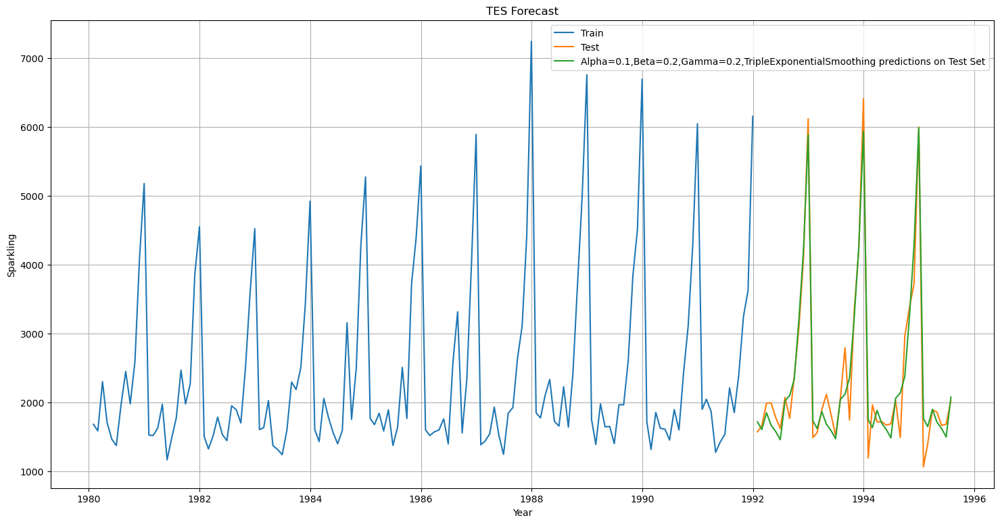

In [114]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(TES_train['Sparkling'], label='Train')
plt.plot(TES_test['Sparkling'], label='Test')

#plt.plot(TES_test['auto_predict'], label='Alpha=0.0758,Beta=0.075,Gamma=0.342,TripleExponentialSmoothing predictions on Test Set')
plt.plot(TES_test['predict',index_best_model], label='Alpha=0.1,Beta=0.2,Gamma=0.2,TripleExponentialSmoothing predictions on Test Set')

plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("TES Forecast")
plt.legend(loc='best')
plt.grid();

#### Model Evaluation

In [115]:
resultsDf_DES = pd.DataFrame({'Test RMSE': [df_results_TES.sort_values(by =['Test RMSE'], ascending = True).values[0][-1]]}
                           ,index=['Alpha=0.1,Beta=0.2,Gamma=0.2,TripleExponentialSmoothing'])   # Complete the code to check the perfromance of the 'Alpha=0.6,Beta=0.00010,DoubleExponentialSmoothing' 

resultsDf = pd.concat([resultsDf, resultsDf_DES])
resultsDf

,Test RMSE
RegressionOnTime,1344.644564
NaiveModel,3979.914692
SimpleAverageModel,1268.462755
"auto_SES,Alpha =0.0370",1290.978200
"Alpha=0.1,SimpleExponentialSmoothing",1356.185563
"auto_DES, Alpha = 0.737,Beta = 0.0001",1992.838366
"Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing",1357.769783
"auto_TES, Alpha=0.077016,Beta=0.077016,Gamma=0.306",351.507911
"Alpha=0.1,Beta=0.2,Gamma=0.2,TripleExponentialSmoothing",304.152583


### Checking for Sationarity

Given that we are trying to forecast and apply a time series model, it is important that our data be stationary, i.e. that all its statistical porpoerties (mean and the varriance) remain constant over time. 
Inorder for a time series to be stationary it has to have the following:

1. constant mean
2. constant variance
3. an auto co-variance that does not depend on time

In [116]:
## Test for stationarity of the series - Dicky Fuller test

from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=12).mean()
    rolstd = timeseries.rolling(window=12).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    ###printing the outcome of the hypothesis test
    if dftest[1] <= 0.05:
        print("Reject null hypothesis and data is stationary")
    else :
        ###
        print("Fail to reject H0 and data is non-stationary ", '\n')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

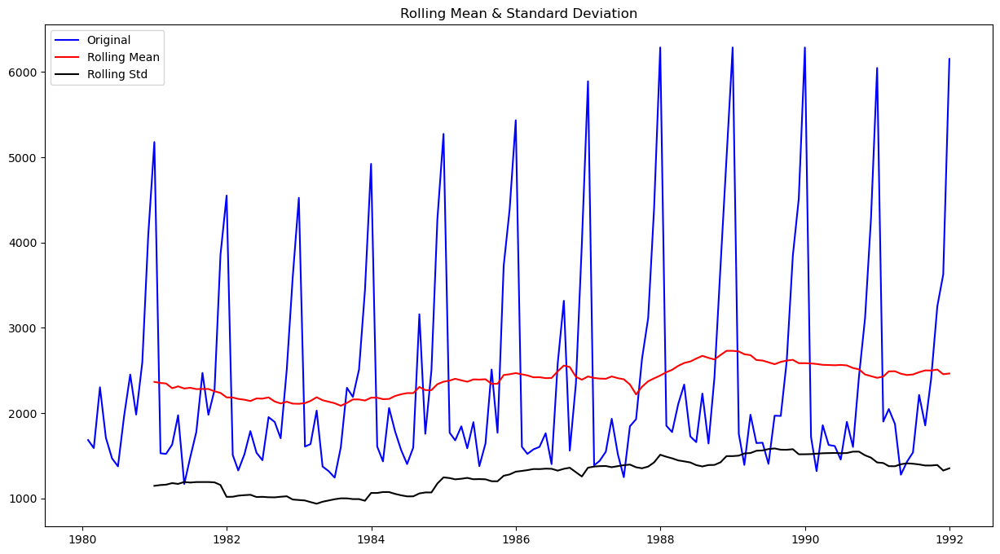

Results of Dickey-Fuller Test:
Fail to reject H0 and data is non-stationary  

Test Statistic                  -1.076304
p-value                          0.724428
#Lags Used                      13.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64 



In [117]:
test_stationarity(train_data['Sparkling_Clipped'])


The time series is not stationary becasue:

1. p-value from the Dickey-Fuller test 0.724428 > 0.05 whcih is our critical value so we fail to reject H0 that the data is non-stationary


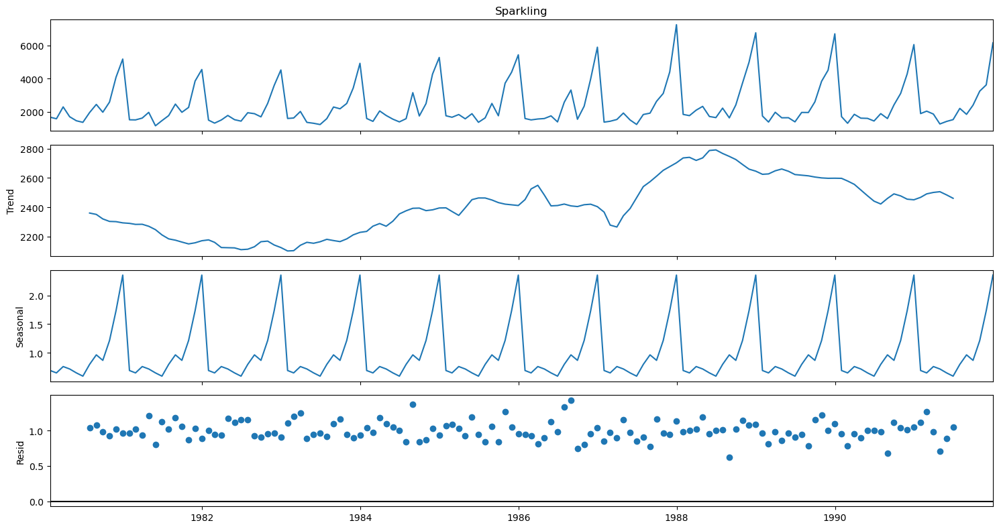

In [118]:
##decomposing the data 
decomposition = seasonal_decompose(train_data['Sparkling'],model='multiplicative')
decomposition.plot();

### Making the time series stationary

Since we have determined that the time series is not stationary there are a few treatments for the data. There are two major reasons for a time series being non-stationary and these tend to be:

1. Trend: if the mean is in any case non-constant then the data is considered to be non-stationary
2. Seasonality: if the data has seasonality in it or any variation that re-occurs at specific timeframes. 


We can choose to treat this in multiple ways:

1. Transformation of the data - this will reduce the trend and deal with the trend. 
2. Differencing - this will deal with both the seasonality and trend and since our data has both seasonlaity and trend we will use this. This is done by taking difference using a lag 

We will start by differencing the data


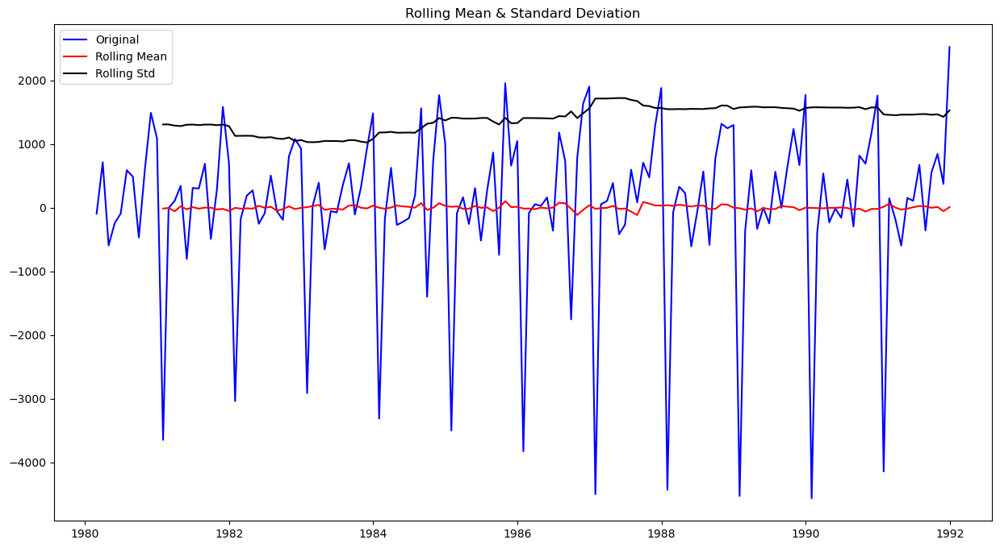

Results of Dickey-Fuller Test:
Reject null hypothesis and data is stationary
Test Statistic                -7.963139e+00
p-value                        2.912230e-12
#Lags Used                     1.200000e+01
Number of Observations Used    1.300000e+02
Critical Value (1%)           -3.481682e+00
Critical Value (5%)           -2.884042e+00
Critical Value (10%)          -2.578770e+00
dtype: float64 



In [119]:
"""
we test the stationarity of our data by taking the first difference and seeing if it makes a difference, 

 1. We create a difference time series
 2. We remove-nas in place 
 3. We test the stationarity of the time series
"""

differenced_time_series = train_data['Sparkling_Clipped'].diff(periods=1)
differenced_time_series.dropna(inplace = True)


test_stationarity(differenced_time_series)

As we can see after differencing our data, the time series is now satationary because:

1. The mean is constant and has little variation over time
2. The std variation has small variation with time 
3. The p-value  2.912230e-12 <<< 0.05 and therefore we reject or fail to accept the null hypothesis and conclude that the time series is stationary

We can therefore proceed with forecasting and building our models in the data 

#### ARIMA Model 

##### Exploring time series for values of p,d and q

we first get an idea of what values of p,d,and q would make sense for us 

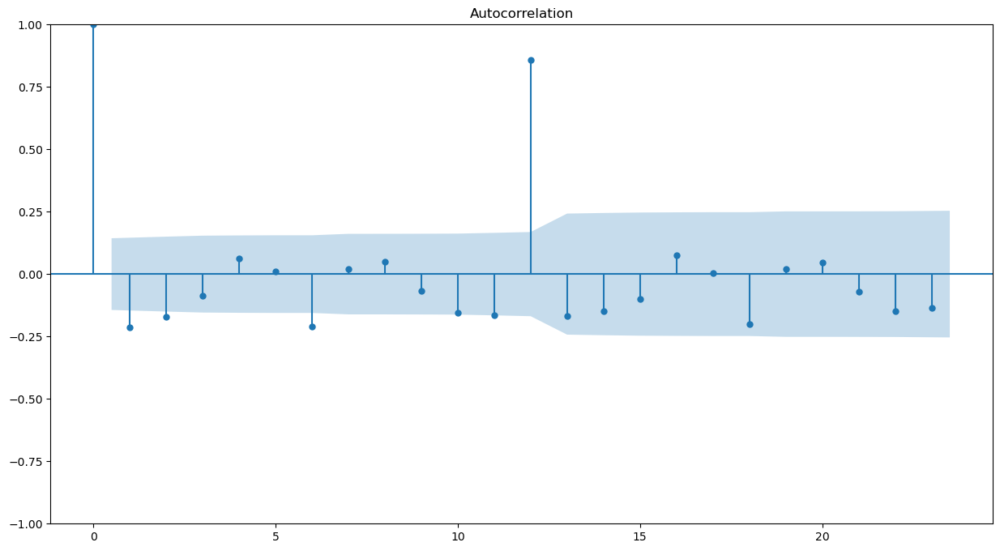

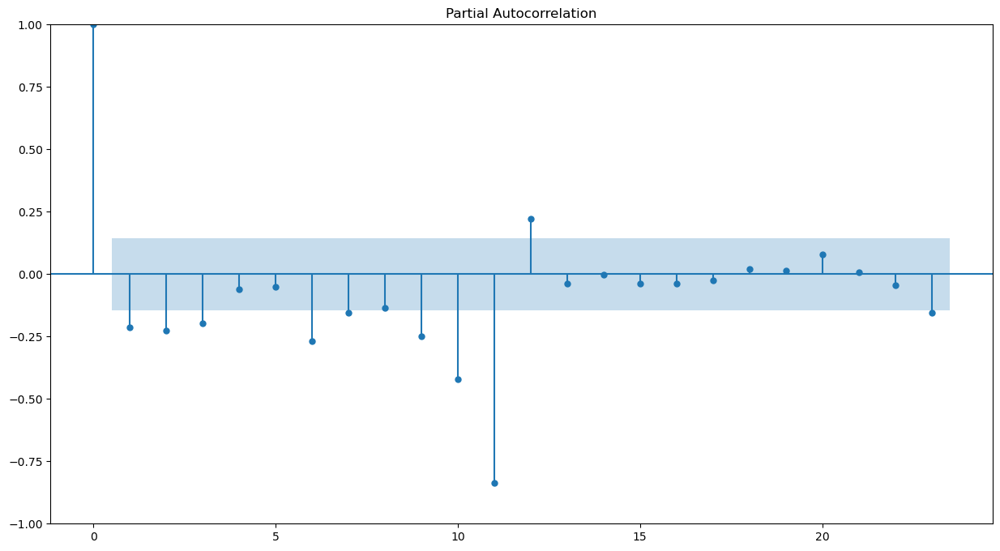

In [120]:
plot_acf(df_final["Sparkling_Clipped"].diff(periods=1).dropna())
#Plot ACF and PACF using statsmodels

plot_pacf(df_final["Sparkling_Clipped"].diff(periods=1).dropna());

Checking the order of differencing we can use

In [121]:
result_1d = adfuller(df_final["Sparkling"].diff().dropna())
print(f""" p-value {result_1d[1]}""")

result_2d= adfuller(df_final["Sparkling"].diff(periods=2).dropna())
print(f""" p-value {result_2d[1]}""")

 p-value 0.0
 p-value 0.0


In both plots we can see that the first lag is the most significant and we therefore consider p to be 1. 
To determine q we can look at the ACF plot and consider at the number of lags crossing the threshold as this helps us determine how much of the past data would be significant enough to consider for the future. In this case we would want the ones with high correlation as they would contribute the most and are the most useful in predicting our future values. We would expect our q to be 2 to 3. We can see from the AD-fuller test above that both the first and second order differencing produces a stationary time series so we expect a value of 1 for d to be sufficient. 
This analysis will help us set a range for the parameter searches. 

Our values for the parameters for grid searches are therefore going to be:

- p: 0 - 4
- q: 0 - 4 
- d: 1-2 

In [122]:
###Creating the parameters for the models
import itertools
p = q = range(0,4)
d = range(1,2)
pdq = list(itertools.product(p,d,q))
print('Examples of the parameter combinations for the models')
for i in range(0,len(pdq)):
    print('Model : {}'.format(pdq[i]))

Examples of the parameter combinations for the models
Model : (0, 1, 0)
Model : (0, 1, 1)
Model : (0, 1, 2)
Model : (0, 1, 3)
Model : (1, 1, 0)
Model : (1, 1, 1)
Model : (1, 1, 2)
Model : (1, 1, 3)
Model : (2, 1, 0)
Model : (2, 1, 1)
Model : (2, 1, 2)
Model : (2, 1, 3)
Model : (3, 1, 0)
Model : (3, 1, 1)
Model : (3, 1, 2)
Model : (3, 1, 3)


In [123]:
# Creating an empty Dataframe with column names only
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [124]:
###run hyper - parameter search 
from statsmodels.tsa.arima.model import ARIMA

for param in pdq: # running a loop within the pdq parameters defined by itertools
    ARIMA_model  =  ARIMA(train_data['Sparkling_Clipped'].values, order=param).fit()
    print('ARIMA{} - AIC{}'.format(param, ARIMA_model.aic))
    
    #printing the parameters and the AIC from the fitted models
    ARIMA_AIC = ARIMA_AIC.append({'param': param, 'AIC': ARIMA_model.aic},ignore_index=True)
    
    #appending the AIC values and the model parameters to the previously created data frame
    #for easier understanding and sorting of the AIC values

ARIMA(0, 1, 0) - AIC2462.923400148405
ARIMA(0, 1, 1) - AIC2459.1483109544283
ARIMA(0, 1, 2) - AIC2427.157170600601
ARIMA(0, 1, 3) - AIC2426.2964726118053
ARIMA(1, 1, 0) - AIC2462.176371753829
ARIMA(1, 1, 1) - AIC2428.574792704891
ARIMA(1, 1, 2) - AIC2427.061431733311
ARIMA(1, 1, 3) - AIC2428.027348160358
ARIMA(2, 1, 0) - AIC2455.6158026664075
ARIMA(2, 1, 1) - AIC2426.0100062824467
ARIMA(2, 1, 2) - AIC2404.1798175402737
ARIMA(2, 1, 3) - AIC2424.3235635933197
ARIMA(3, 1, 0) - AIC2453.223330622951
ARIMA(3, 1, 1) - AIC2427.62908683188
ARIMA(3, 1, 2) - AIC2422.586082662382
ARIMA(3, 1, 3) - AIC2412.311062543722


In [125]:
##see the top perfroming model
ARIMA_AIC.sort_values(by='AIC',ascending=True).head()

,param,AIC
10,"(2, 1, 2)",2404.179818
15,"(3, 1, 3)",2412.311063
14,"(3, 1, 2)",2422.586083
11,"(2, 1, 3)",2424.323564
9,"(2, 1, 1)",2426.010006


In [126]:
###choose the model that has performed the best as use the parameters
auto_ARIMA = ARIMA(train_data['Sparkling_Clipped'], order=(2,1,2))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:      Sparkling_Clipped   No. Observations:                  144
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -1197.090
Date:                Sun, 29 Oct 2023   AIC                           2404.180
Time:                        18:05:20   BIC                           2418.994
Sample:                    01-31-1980   HQIC                          2410.200
                         - 12-31-1991                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3289      0.043     30.646      0.000       1.244       1.414
ar.L2         -0.5729      0.063     -9.122      0.000      -0.696      -0.450
ma.L1         -1.9919      0.112    -17.746      0.0

#### Residual Check

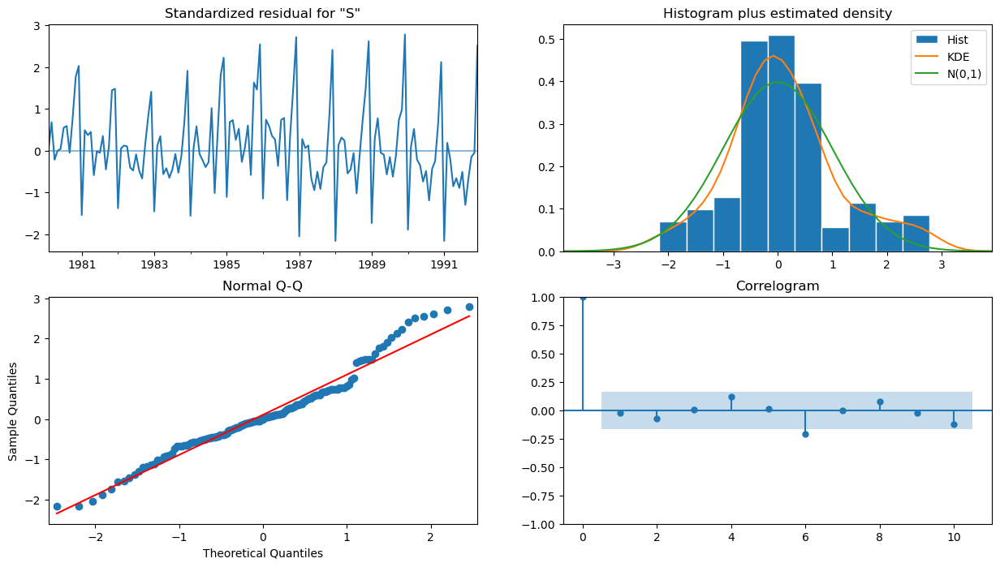

In [127]:
results_auto_ARIMA.plot_diagnostics();

Most of the plots are as expected but the QQ plot shows a lot of outliers at the tail end of the model

In [128]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(test_data))

#### Model Evaluation

In [129]:
## Mean Absolute Percentage Error (MAPE) - Function Definition

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean((np.abs(y_true-y_pred))/(y_true))*100

## Importing the mean_squared_error function from sklearn to calculate the RMSE

from sklearn.metrics import mean_squared_error

In [130]:
rmse = mean_squared_error(test_data['Sparkling'],(predicted_auto_ARIMA),squared=False)
mape = mean_absolute_percentage_error(test_data['Sparkling'],(predicted_auto_ARIMA))
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 1300.8578710583665 
MAPE: 43.382776272537896


In [131]:
from math import sqrt
from sklearn.metrics import  mean_squared_error
rmse = sqrt(mean_squared_error(test_data['Sparkling'],(predicted_auto_ARIMA)))
print(rmse)

1300.8578710583665


In [132]:
ARIMA_AIC.sort_values(by='AIC',ascending=True)

,param,AIC
10,"(2, 1, 2)",2404.179818
15,"(3, 1, 3)",2412.311063
14,"(3, 1, 2)",2422.586083
11,"(2, 1, 3)",2424.323564
9,"(2, 1, 1)",2426.010006
3,"(0, 1, 3)",2426.296473
6,"(1, 1, 2)",2427.061432
2,"(0, 1, 2)",2427.157171
13,"(3, 1, 1)",2427.629087
7,"(1, 1, 3)",2428.027348


In [133]:
resultsDf_ARIMA = pd.DataFrame({'Test RMSE': [sqrt(mean_squared_error(test_data['Sparkling'],(predicted_auto_ARIMA)))]}
                           ,index=['ARIMA(2,1,2)']) 

In [134]:
resultsDf = pd.concat([resultsDf, resultsDf_ARIMA])
resultsDf

,Test RMSE
RegressionOnTime,1344.644564
NaiveModel,3979.914692
SimpleAverageModel,1268.462755
"auto_SES,Alpha =0.0370",1290.978200
"Alpha=0.1,SimpleExponentialSmoothing",1356.185563
"auto_DES, Alpha = 0.737,Beta = 0.0001",1992.838366
"Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing",1357.769783
"auto_TES, Alpha=0.077016,Beta=0.077016,Gamma=0.306",351.507911
"Alpha=0.1,Beta=0.2,Gamma=0.2,TripleExponentialSmoothing",304.152583
"ARIMA(2,1,2)",1300.857871


In [135]:
resultsDf_ARIMA_singular = pd.DataFrame({'RMSE': rmse,'MAPE':mape}
                           ,index=['ARIMA(2,1,2)'])




In [136]:


resultsDf

,Test RMSE
RegressionOnTime,1344.644564
NaiveModel,3979.914692
SimpleAverageModel,1268.462755
"auto_SES,Alpha =0.0370",1290.978200
"Alpha=0.1,SimpleExponentialSmoothing",1356.185563
"auto_DES, Alpha = 0.737,Beta = 0.0001",1992.838366
"Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing",1357.769783
"auto_TES, Alpha=0.077016,Beta=0.077016,Gamma=0.306",351.507911
"Alpha=0.1,Beta=0.2,Gamma=0.2,TripleExponentialSmoothing",304.152583
"ARIMA(2,1,2)",1300.857871


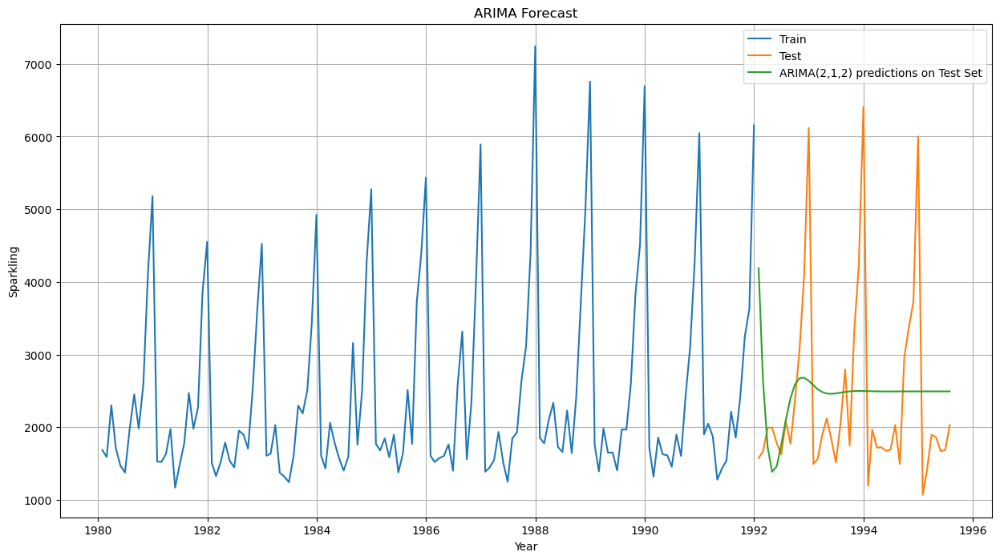

In [137]:

plt.plot(train_data['Sparkling'], label='Train')
plt.plot(test_data['Sparkling'], label='Test')


plt.plot((predicted_auto_ARIMA), label='ARIMA(2,1,2) predictions on Test Set')

plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("ARIMA Forecast")


plt.legend(loc='best')
plt.grid();

##### SARIMA 

We begin by getting an understanding of our seasonality over time. I will choose the time horizon of the test set and see what the seasonality is over that period. 

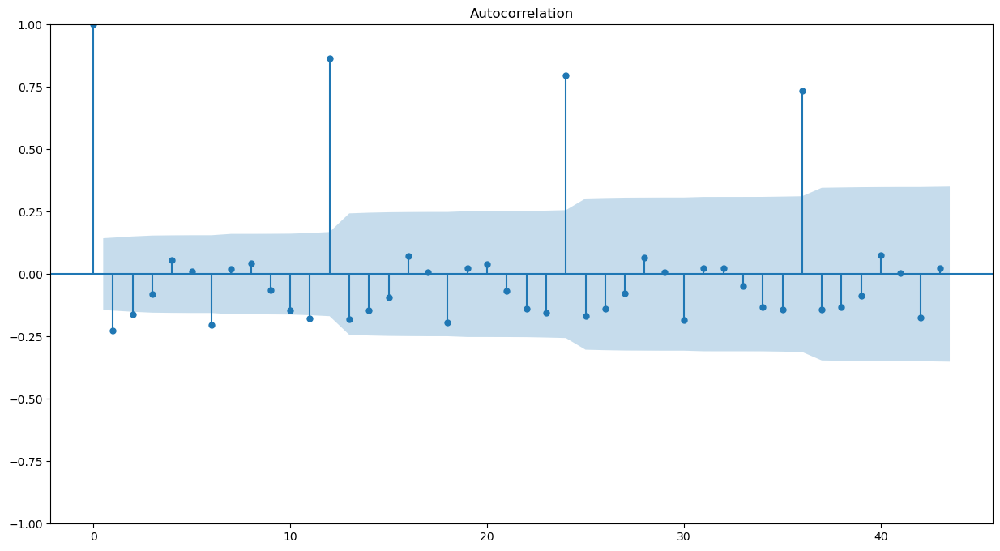

In [138]:
#Plot ACF and PACF using statsmodels
plot_acf(df_final["Sparkling"].diff(periods=1).dropna(), lags = len(test_data));




We can see a seasonality of 12 in the ACF plot,  the decompostion in our EDA shows that the seasonal period is also 12 so we will use 12 as our seasonal period. 

In [139]:
##Creating the model combinations

import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
PDQ = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of the parameter combinations for the Model are')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], PDQ[i]))

Examples of the parameter combinations for the Model are
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (0, 1, 3)(0, 0, 3, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (1, 1, 3)(1, 0, 3, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)
Model: (2, 1, 3)(2, 0, 3, 12)
Model: (3, 1, 0)(3, 0, 0, 12)
Model: (3, 1, 1)(3, 0, 1, 12)
Model: (3, 1, 2)(3, 0, 2, 12)
Model: (3, 1, 3)(3, 0, 3, 12)


In [140]:
##creating the empty dataframe to plot the results in 
SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC

,param,seasonal,AIC


In [141]:
train_data.head()

,Sparkling_Clipped,Sparkling
date_time,,
1980-01-31,1686,1686
1980-02-29,1591,1591
1980-03-31,2304,2304
1980-04-30,1712,1712
1980-05-31,1471,1471


In [142]:
#using threading because my lfgbs optimizer stopped working a few hours before submission
#please note this part takes time
import warnings
import statsmodels.api as sm
import pandas as pd
import concurrent.futures

warnings.filterwarnings('ignore')

# Assuming pdq and PDQ are lists of parameters and train_data is a DataFrame
SARIMA_AIC = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

def fit_sarima_model(param, param_seasonal):
    SARIMA_model = sm.tsa.statespace.SARIMAX(train_data['Sparkling_Clipped'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
    results_SARIMA = SARIMA_model.fit(maxiter=200, method='cg')
    #results_SARIMA = SARIMA_model.fit(maxiter=800)
    print(f'SARIMA{param}x{param_seasonal} - AIC:{results_SARIMA.aic}')
    return {'param': param, 'seasonal': param_seasonal, 'AIC': results_SARIMA.aic}

# Using ThreadPoolExecutor to parallelize the execution
with concurrent.futures.ThreadPoolExecutor() as executor:
    futures = [executor.submit(fit_sarima_model, param, param_seasonal) 
               for param in pdq for param_seasonal in PDQ]
    
    for future in concurrent.futures.as_completed(futures):
        SARIMA_AIC = SARIMA_AIC.append(future.result(), ignore_index=True)

Optimization terminated successfully.
         Current function value: 7.751307
         Iterations: 7
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 9.682606
         Iterations: 6
         Function evaluations: 73
         Gradient evaluations: 73
SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:3887.1436085126074
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:3041.954643080705
         Current function value: 25.913435
         Iterations: 0
         Function evaluations: 18
         Gradient evaluations: 6
Optimization terminated successfully.
         Current function value: 6.729041
         Iterations: 9
         Function evaluations: 35
         Gradient evaluations: 35
SARIMA(0, 1, 0)x(0, 0, 3, 12) - AIC:8235.438067536941
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:2617.069292460136
Optimization terminated successfully.
         Current function value: 6.958860
         Iterations: 29
         Function evaluations: 72

In [143]:
SARIMA_AIC.sort_values(by='AIC',ascending=True)

,param,seasonal,AIC
213,"(3, 1, 0)","(3, 0, 0, 12)",1898.290464
253,"(3, 1, 3)","(3, 0, 0, 12)",2180.901170
254,"(3, 1, 3)","(3, 0, 1, 12)",2182.034278
255,"(3, 1, 3)","(3, 0, 2, 12)",2182.451342
252,"(3, 1, 2)","(3, 0, 2, 12)",2183.214580
...,...,...,...
73,"(1, 1, 1)","(0, 0, 3, 12)",8167.707947
2,"(0, 1, 0)","(0, 0, 3, 12)",8235.438068
185,"(3, 1, 0)","(0, 0, 3, 12)",8237.148429
121,"(2, 1, 0)","(0, 0, 3, 12)",8238.210165


In [168]:
###fir the model
import statsmodels.api as sm
##i have had to use cfg processing and it takes quite a wile 
auto_SARIMA = sm.tsa.statespace.SARIMAX(train_data['Sparkling_Clipped'],order=(3,1,0),seasonal_order=(3,0,0,12),enforce_stationarity=False,
                                       enforce_invertibility=False)
results_auto_SARIMA = auto_SARIMA.fit(method = "cg")
print(results_auto_SARIMA.summary())

         Current function value: 33.315046
         Iterations: 50
         Function evaluations: 105
         Gradient evaluations: 105
                                     SARIMAX Results                                      
Dep. Variable:                  Sparkling_Clipped   No. Observations:                  144
Model:             SARIMAX(3, 1, 0)x(3, 0, 0, 12)   Log Likelihood                -900.204
Date:                            Sun, 29 Oct 2023   AIC                           1814.407
Time:                                    19:29:05   BIC                           1832.918
Sample:                                01-31-1980   HQIC                          1821.907
                                     - 12-31-1991                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------

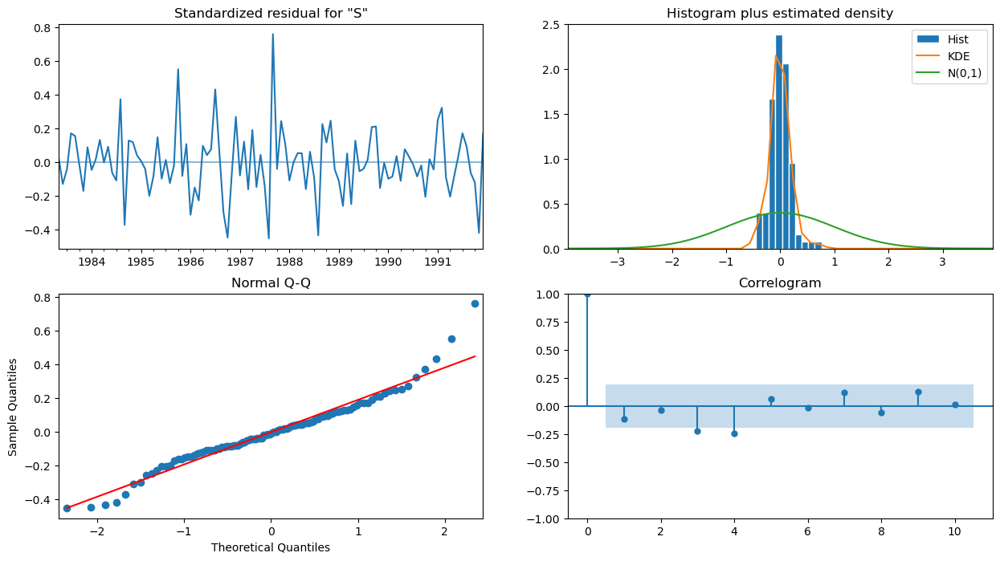

In [169]:
###running hte diagnostics 
results_auto_SARIMA.plot_diagnostics();

There are a few outliers on the Q-Q plot but everything else looks in line with the theoretical expectations and there is no pattern to be derived from the plots


#### Model Evaluation

In [170]:
#Predict on the Test Set using this model and evaluate the model.
predicted_auto_SARIMA = results_auto_SARIMA.get_forecast(steps=len(test_data))

In [171]:
#get the head of the data 
predicted_auto_SARIMA.summary_frame(alpha=0.05).head()

Sparkling_Clipped,mean,mean_se,mean_ci_lower,mean_ci_upper
1992-01-31,1717.166653,2249.546691,-2691.863843,6126.197149
1992-02-29,1259.098096,2563.218262,-3764.717383,6282.913574
1992-03-31,1476.780926,2614.680619,-3647.898919,6601.460771
1992-04-30,1179.226095,2828.514581,-4364.560614,6723.012804
1992-05-31,1213.039611,3125.360808,-4912.555011,7338.634234


In [172]:
##Get the rmse and caluclate the error
rmse = mean_squared_error(test_data['Sparkling'],(predicted_auto_SARIMA.predicted_mean),squared=False)
mape = mean_absolute_percentage_error(test_data['Sparkling'],(predicted_auto_SARIMA.predicted_mean))
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 704.493874007528 
MAPE: 29.56426350152451


In [1]:
##add resukts to the data frame 
resultsDf_SARIMA = pd.DataFrame({'Test RMSE': [sqrt(mean_squared_error(test_data['Sparkling'],(predicted_auto_SARIMA.predicted_mean)))]}
                           ,index=['SARIMA(3,1,0)(3,0,0,12)']) 
resultsDf = pd.concat([resultsDf, resultsDf_SARIMA])
resultsDf

NameError: name 'pd' is not defined

In [150]:
temp_resultsDf = pd.DataFrame({'RMSE': rmse,'MAPE':mape}
                           ,index=['SARIMA(3,1,0)(3,0,0,12)'])

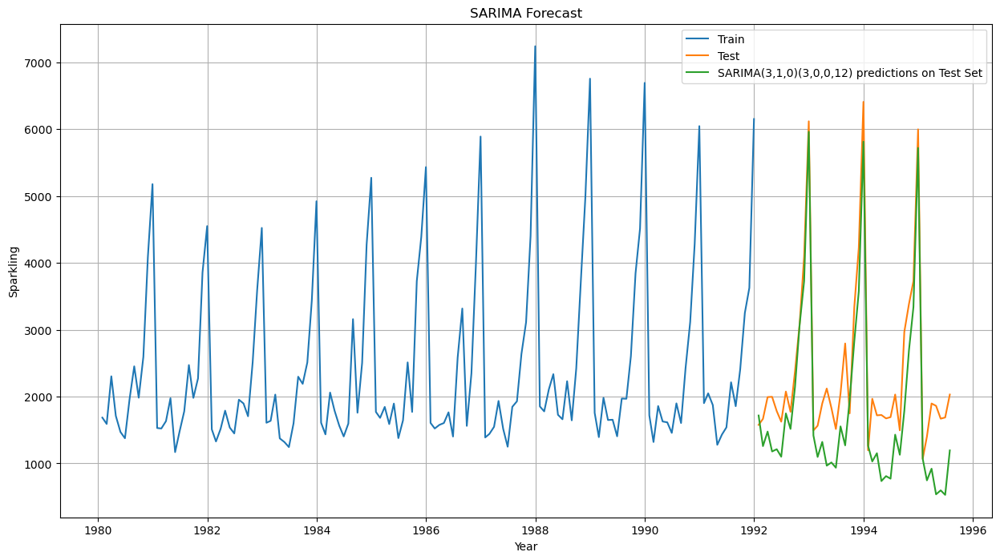

In [178]:
plt.plot(train_data['Sparkling'], label='Train')
plt.plot(test_data['Sparkling'], label='Test')


plt.plot((predicted_auto_SARIMA.predicted_mean), label='SARIMA(3,1,0)(3,0,0,12) predictions on Test Set')

plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("SARIMA Forecast")


plt.legend(loc='best')
plt.grid();

## Model Comparison and Final Model Selection

In this section we choose which model performs the best on the test data set

In [177]:
###sort the results 
resultsDf.sort_values(by = 'Test RMSE')

,Test RMSE
"Alpha=0.1,Beta=0.2,Gamma=0.2,TripleExponentialSmoothing",304.152583
"auto_TES, Alpha=0.077016,Beta=0.077016,Gamma=0.306",351.507911
"SARIMA(3,1,0)(3,0,0,12)",704.493874
SimpleAverageModel,1268.462755
"auto_SES,Alpha =0.0370",1290.978200
"ARIMA(2,1,2)",1300.857871
RegressionOnTime,1344.644564
"Alpha=0.1,SimpleExponentialSmoothing",1356.185563
"Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing",1357.769783
"auto_DES, Alpha = 0.737,Beta = 0.0001",1992.838366


#### Plotting the top 2 models

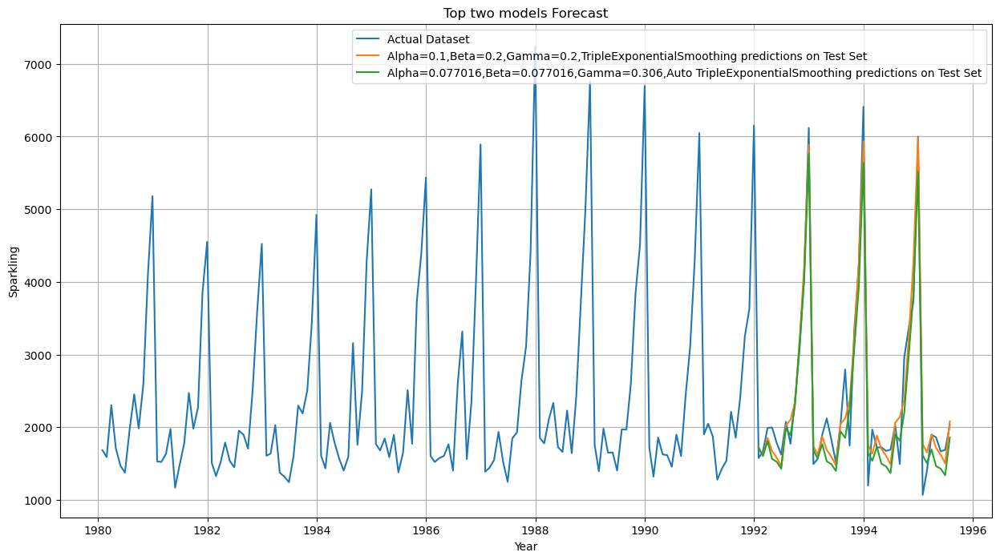

In [179]:

plt.plot(df_final['Sparkling'], label='Actual Dataset')


plt.plot(TES_test['predict',index_best_model], label='Alpha=0.1,Beta=0.2,Gamma=0.2,TripleExponentialSmoothing predictions on Test Set')

plt.plot(TES_test['auto_predict'], label='Alpha=0.077016,Beta=0.077016,Gamma=0.306,Auto TripleExponentialSmoothing predictions on Test Set')


plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("Top two models Forecast")
plt.legend(loc='best')
plt.grid();

The TES models are the best performing models

The TES model found through hyper-parameter selection is the best perfroming model

The TES model has the following parameters:

- Level: alpha = 0.1 this defines how much of the past to consider. Values lie between [0,1] and an alpha=1 gives importance only to the last data point. In this case the model gives importance to a lot of the past values 
- Trend: beta = 0.2 this defines how much of the past trend to consider and this value means that we should consider a lot of the data when making a prediction. 
- Trend: The best model trend is multiplicative
- Seasonality gamma=0.2 

## Forecasting using Final Model

We have selected the most optimum model for the data and we will proceed to build the model and predict 12 months into the future.

In [180]:
####see the results from the TES Model
df_results_TES.sort_values(by =['Test RMSE'], ascending = True).head()

,index,trend,seasonal_periods,seasonal,smoothing_level,smoothing_trend,smoothing_seasonal,damped_trend,damping_trend,Train RMSE,Test RMSE
17517,17517,mul,12,mul,0.1,0.2,0.2,False,0.4,385.434751,304.152583
16059,16059,mul,12,mul,0.1,0.2,0.2,False,0.3,385.434751,304.152583
13143,13143,mul,12,mul,0.1,0.2,0.2,False,0.1,385.434751,304.152583
24807,24807,mul,12,mul,0.1,0.2,0.2,False,0.9,385.434751,304.152583
18975,18975,mul,12,mul,0.1,0.2,0.2,False,0.5,385.434751,304.152583


In [181]:
###getting the best model variables from the results table
trend = df_results_TES.sort_values(by =['Test RMSE'], ascending = True).values[0][1]
seasonal_periods = df_results_TES.sort_values(by =['Test RMSE'], ascending = True).values[0][2]
seasonal = df_results_TES.sort_values(by =['Test RMSE'], ascending = True).values[0][3]
smoothing_level = df_results_TES.sort_values(by =['Test RMSE'], ascending = True).values[0][4]
smoothing_trend = df_results_TES.sort_values(by =['Test RMSE'], ascending = True).values[0][5]
smoothing_seasonal = df_results_TES.sort_values(by =['Test RMSE'], ascending = True).values[0][6]
damped_trend = df_results_TES.sort_values(by =['Test RMSE'], ascending = True).values[0][7]
damping_trend = df_results_TES.sort_values(by =['Test RMSE'], ascending = True).values[0][8]

In [182]:
####Setting the final model 
final_model= ExponentialSmoothing(TES_train['Sparkling_Clipped'], trend=trend, 
                                           damped_trend=damped_trend,
                                           seasonal_periods=seasonal_periods, freq = 'M', 
                                           seasonal=seasonal
                                           #,use_boxcox=use_boxcox
                                           ).fit(
                                           # use_boxcox = use_boxcox,
                                            smoothing_level=smoothing_level, 
                                            smoothing_trend=smoothing_trend, 
                                            smoothing_seasonal= smoothing_seasonal,
                                            damping_trend=damping_trend,  
                                            optimized=False, 
                                            use_brute=True)

In [183]:
##setting the predictions for the year
predicitons_final = final_model.predict(start='31-08-1995',end='31-08-1996')

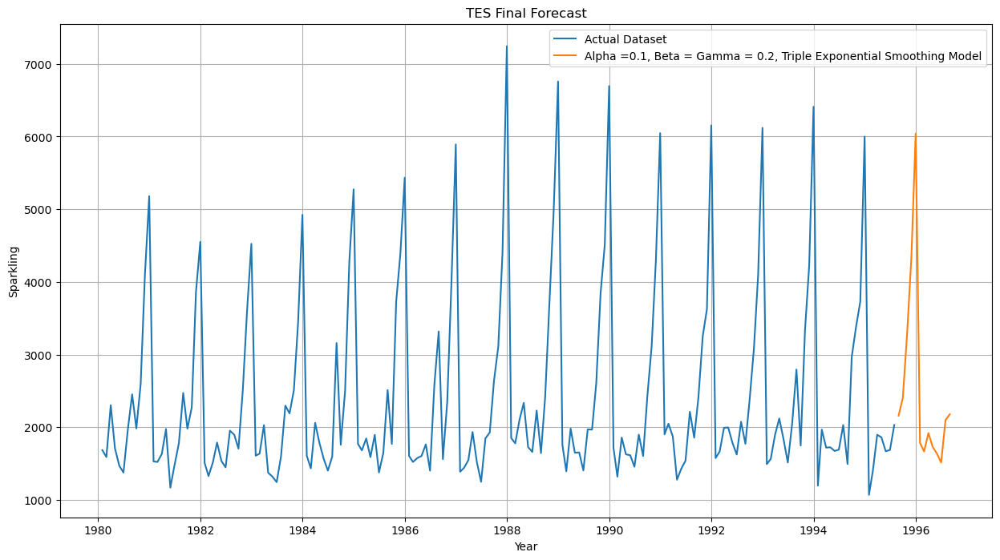

In [185]:

plt.plot(df_final['Sparkling'], label='Actual Dataset')


plt.plot(predicitons_final,label='Alpha =0.1, Beta = Gamma = 0.2, Triple Exponential Smoothing Model')

plt.xlabel('Year')
plt.ylabel('Sparkling')
plt.title("TES Final Forecast")
plt.legend(loc='best')
plt.grid();

In [186]:
####calculating the prediction interval
pred_1_df = pd.DataFrame({'lower_CI':predicitons_final - 1.96*np.std(final_model.resid,ddof=1),
                          'prediction':predicitons_final,
                          'upper_ci':predicitons_final + 1.96*np.std(final_model.resid,ddof=1)})
pred_1_df.head()

,lower_CI,prediction,upper_ci
1995-08-31,1466.439234,2160.616141,2854.793049
1995-09-30,1709.045668,2403.222575,3097.399483
1995-10-31,2603.338646,3297.515553,3991.692461
1995-11-30,3633.749013,4327.925920,5022.102827
1995-12-31,5346.591176,6040.768083,6734.944990


In [187]:
##look at the tail of the data 
pred_1_df.tail()

,lower_CI,prediction,upper_ci
1996-04-30,1038.892794,1733.069701,2427.246609
1996-05-31,942.991674,1637.168581,2331.345488
1996-06-30,821.131776,1515.308684,2209.485591
1996-07-31,1404.631833,2098.808741,2792.985648
1996-08-31,1485.479788,2179.656695,2873.833603


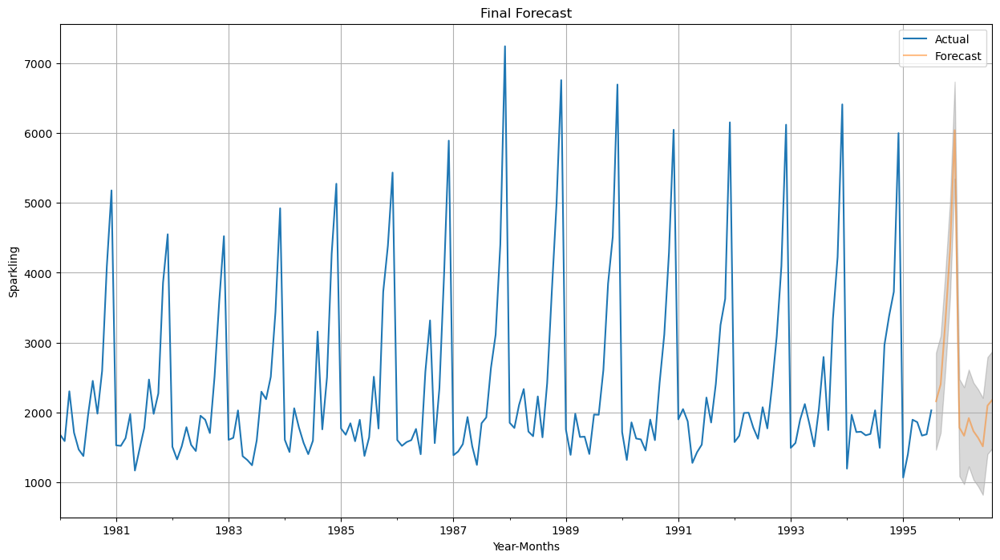

In [188]:
# plot the forecast along with the confidence band

axis = df_final["Sparkling"].plot(label='Actual')
pred_1_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(pred_1_df.index, pred_1_df['lower_CI'], pred_1_df['upper_ci'], color='k', alpha=.15)
axis.set_xlabel('Year-Months')
axis.set_ylabel('Sparkling')
plt.title("Final Forecast")
plt.legend(loc='best')
plt.grid()
plt.show()

##### High Level Analysis for Business Insights and Recommendations

We will look at a few things:

1. Total sales to date
2. Perfromance in sales of the next 12 months compared to the next 12 months
3. Look at drivers of any difference if there are any 
4. Identify anything else in the data

In [189]:
#Sales in the first years
print(f""" We have sold  {sum(df_final['Sparkling'])} of Sparkling to date""")


 We have sold  449252 of Sparkling to date


In [190]:
###the sales for the previous 12 months

print(f""" In the last 12 months we sold {sum(df_final["Sparkling"].tail(12))} of Sparkling""")

 In the last 12 months we sold 29196 of Sparkling


In [191]:
## sales in the next 12 month 
print(f""" We are expected to sell {sum(predicitons_final)} of Sparkling inb the next 12 month""")

 We are expected to sell 32765.92244576343 of Sparkling inb the next 12 month


In [192]:
### look at the how the predicted sales compare to the last 12 months 
YOY_CHANGE = ((sum(predicitons_final) - sum(df_final["Sparkling"].tail(12)) ) / sum(df_final["Sparkling"].tail(12)) ) * 100
print(f"""We will sell {YOY_CHANGE}% more Sparkling in the next 12 months compared to the previous 12 months""")


We will sell 12.227436791901049% more Sparkling in the next 12 months compared to the previous 12 months


In [197]:
quarterly_prediction = predicitons_final.groupby(predicitons_final.index.quarter).sum().values
quarterly_prediction

array([ 5371.86177046,  4885.54696624,  8842.30415281, 13666.20955626])

In [198]:
quarterly_actuals= df_final["Sparkling"].tail(12).groupby(df_final["Sparkling"].tail(12).index.quarter).sum().values
quarterly_actuals

array([ 4369,  5220,  6494, 13113])

In [199]:
##percentage change quarter on quarter 
((quarterly_prediction - quarterly_actuals)/quarterly_actuals) * 100

array([22.95403457, -6.40714624, 36.16113571,  4.21878713])

The growth in the sales is driven by stronger expected sales for the next 12 months in quarter 1 and quarter 3 compared to the previous 12 months. We expect to see a 36.2% growth in sales for quarter 3 and a 23% growth in sales for quarter one.We also see a 4% growth in quarter four sales. The business is expected to grow quarter on quarter except for quarter 2. 

## Business Insights and Recommendations

### INSIGHTS

- To date sparkling has sold 449 252 of Sparkling bottles since 1980 
- We are expected to sell 32765 of Sparkling wine in the next 12 months
- We are expected to sell 12.23% less Sparkling in the next 12 month compared to previous 12 months
- The growth in the sales is driven by stronger expected sales for the next 12 months in quarter 1 and quarter 3 compared to the previous 12 months. We expect to see a 36.2% growth in sales for quarter 3 and a 23% growth in sales for quarter one.We also see a 4% growth in quarter four sales. The business is expected to grow quarter on quarter except for quarter 2.  
- Sparkling wine is a very seasonal product with massive uptake during the final quarter which could point to behavioural or climate aspects or social events that onlu occur in the fourth quarter
- Within a year quarter 4 sales are consistently 77% higher than the yearly average
- Quarter four sales make up to 44% of the the total sales to date which is nealy half the total sparkling wine sales showing how cyclical the sales are and how critical quarter four performance is to overall business performance
- Our highest sales on record happen in December which aligns with holiday season
- Business generally picks from Q2 to Q4 with a sharp drop from the end of Q4 to Q2
- The next 12 months are expected to follow a similar pattern as already exhibited
- The business has a 12 month season and every year is expected to follow the same behaviour in sales which makes creating campaigns and promotions easier
- The sales of sparkling wine have shown an upward trend over the years. This indicates a growing market and increased consumer interest in sparkling wine.
- The sales data exhibits clear seasonality, possibly due to holidays and festive seasons when the consumption of wine is generally higher. Specific months appear to consistently have higher sales.


### RECOMMENDATIONS

- We recommend that the business set up campaigns and promotions to maximise on the purchasing patterns of our clients who generally are more open to buying the Sparkling wine in Quarter 4
- The business can run discounts to boost sales in Quarter 1 and 2 to drive up business when demand is expected to be lower 
- Given the observed seasonality, it would be advisable to manage stock levels to meet the higher demand during peak months and avoid overstocking during off-peak months.
- We can run further analysis and consider external factors such as economic indicators or competitor activities that could affect or influence sales
- We can forecast with different models such as LSTM to get better forecasts


__________